<a href="https://colab.research.google.com/github/Mak7-bit/IPS-project-/blob/Mak7---IPS---1st-iter-code/Gaussians_and_Doubles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
import numpy as np
import scipy
from matplotlib import pyplot as plt
%matplotlib inline
import random
from scipy.signal import hanning, tukey, boxcar
from scipy.spatial import distance
from scipy.ndimage import rotate
from math import sin, cos, radians, pi

from astropy.modeling import models
from astropy.modeling.models import Rotation2D, Gaussian2D

import pymc3 as pm

!pip install iminuit # you can comment this out once it has run once
import iminuit

!pip install astropy
import astropy

from numpy.fft import ifft, fft, ifft2, fft2, fftshift, ifftshift, rfft, rfft2, fftfreq

from scipy.constants import au, c
z=au
k = 2*np.pi / 2.
                                                                                ### Fucntions ###


def GaussHPBWVariationsLog(start,stop,step):      ### Returns an array of values for hpbw in logspace
  standardDev_range = np.logspace(start,stop, step)
  return (standardDev_range)


def FresnelFilterNew(wavelenght, q_array): ## Fresnel Filter according to JP's formula, returns FF multiplied by Kolmogorov turbulence. Requires q as an argument 
        ### B - Constructed FF
  #x = 5  # n.pixels at first r(r- in pixels)
  z = (1.496*(10)**11) # metres  =  1 AU
  k = 2*pi / wavelenght
  z_k = z/k # z/k) fresnel scale   should be 1; whatever is inside the sin is = 1 so can calc the q
  r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
  r_F_u = 1/r_F
  #q = x*radius/radius.max()/r_F
  ff_jp = np.sin((q_array)**(2)*z/(2*k))**2
  turbulence = np.nan_to_num((q_array/r_F_u)**(-11/6.))
  ff_turb = ff_jp*turbulence
  ff_turb_sum = np.sum(ff_turb, axis=1)
  
  return (ff_turb)

def ScintilationIndexNew(visibility, fresnel_filter):  ## Takes in visibilit array and FF*Turbulence to calculate Scintilation Index
  ABC = visibility*fresnel_filter
  ABC_doubleIntegral = sum(list(map(sum, ABC))) # S. Index
  return (ABC_doubleIntegral)


def ScintilationIndexNormalisation(fresnel_filter, scintilation_index): ## Normalizes scintillation index by dividing it by an integral of FF and taking a sqaure root out of the result
      ## Scintilation Index: Normalised by ∫ ∫ BC === sqrt((∫ ∫ ABC)/(∫ ∫ BC))
  ff_turb_sum = np.sum(fresnel_filter, axis=1)
  BC = ff_turb_sum
  norm = np.sum(fresnel_filter)#, axis=0)
  siNorm = np.sqrt(scintilation_index/norm)
  return siNorm

def get_gaussian_visibilities(theta_s, b, w=2): # theta_s = hpbw
    """
    produce 1D gaussian for
    - Gaussian FWHM theta_s (in arcseconds)
    - 2d array of baseline lengths b ( in m)
    - wavelength in m
    """
    A = np.radians(1)/3600.
    F = 2*np.sqrt(2*np.log(2))
    theta_r = A*theta_s
    b_hpbw = w/theta_r
    #print(b_hpbw)
    return np.exp(-0.5*(F*b/b_hpbw)**2)



     
def get_q_gaussian(wavelenght):
  r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
  q_new_values = np.linspace(10/(r_F), 0.001/r_F, 50)

  arr = np.sqrt(q_new_values[:, None]**2 + q_new_values[None, :]**2)
  arr1 = np.empty((50,50))
  for x in range(50):
    for y in range(50):
      arr1[x,y] = arr[-x,y]
  arr2 = np.concatenate((arr, arr1))

  arr3 = np.empty((100,50))
  for x in range(100):
    for y in range(50):
      arr3[x,y] = arr2[x,-y]
  arr4 = np.concatenate((arr2, arr3), axis=1)

  arr2 = arr[::-1, :]
  arr3 = arr[:,::-1]
  arr4 = arr[::-1, ::-1]

  arr12 = np.concatenate((arr, arr2))
  arr34 = np.concatenate((arr3, arr4))
  arrF = np.concatenate((arr12, arr34), axis=1)
  return arrF



def get_q_doubles(wavelenght):
  r_F = np.sqrt((wavelenght*z)/(2*pi))

  q_double = np.linspace(10/(r_F), 0.001/r_F, 50)

  q = np.hypot(q_double[None, :], q_double[:, None])                ## q - main for doubles

  qx = q_double[None, :] * np.ones([len(q_double), 1])
  #plt.title('q')
  #plt.imshow(q)
  #plt.show()
  #plt.title('qx')
  #plt.imshow(qx)
  #plt.show()
  #plt.title('cos(4*pi*qx/100)')
  #plt.imshow(np.cos(4*np.pi*qx/100))
  #plt.show()

  arr = q

  arr2 = arr[::-1, :]

  arr2 = arr[::-1, :]
  arr3 = arr[:,::-1]
  arr4 = arr[::-1, ::-1]

  arr12 = np.concatenate((arr, arr2))
#plt.imshow(arr12)
#plt.show()
  arr34 = np.concatenate((arr3, arr4))
#plt.imshow(arr34)
#plt.show()
  arrF = np.concatenate((arr12, arr34), axis=1)
  return arrF, qx

def get_qx_final_double(qx):
  qx_neg_upper = qx[:,::-1]
  qx_neg_lower = qx_neg_upper
  qx_pos_lower = qx
  qx_neg = np.concatenate((qx_neg_upper, qx_neg_lower))
  qx_pos = np.concatenate((qx, qx_pos_lower))
  #plt.title('qx joint pos')
  #plt.imshow(qx_pos)
  #plt.show()
  qx_fin = np.concatenate((qx_neg, qx_pos), axis=1)
  return qx_fin

def get_double_ps(width, angle):     # width = separation dist in " , angle = orientation in degrees
  A = np.radians(1)/3600.
  F = 2*np.sqrt(2*np.log(2)) 
  C = 2*A*F*np.pi
  q, qx = get_q_doubles(2)
  qx_fin = get_qx_final_double(qx)

  qx_final_rot = rotate(qx_fin, angle, reshape=False)
  qx_rot_trunc = qx_final_rot[15:85,15:85]
  
  b = qx_rot_trunc * z/k
  q_reduced = (q[15:85,15:85])
  array_x = np.arange(-35,35, 1)

  separation = width
  Visibility = np.abs(np.cos(np.pi*b*separation*A))
  FF = FresnelFilterNew(2, q_reduced)                       #### q_reduced for roated and q for 100x100 unrotated array 
  #SI = ScintilationIndexNew(Visibility**2,FF)
  #SInorm = ScintilationIndexNormalisation(FF,SI)

  powerSpectrum_s = np.sum(Visibility**2*FF, axis=1)
  powerSpectrum_source = []
  for i in powerSpectrum_s: 
    if i > 0:
      powerSpectrum_source.append(i)
  powerSpectrum_p = np.sum(FF, axis=1)
  powerSpectrum_point = []
  for i in powerSpectrum_p: 
    if i > 0:
      powerSpectrum_point.append(i)
  plt.title(f'Separation: {separation:.2f}')
  plt.loglog(array_x, powerSpectrum_source)
  plt.loglog(array_x, powerSpectrum_point)
  plt.legend('PS Source','PS Point')
  plt.show()
  plt.title('PS')
  plt.plot(array_x, powerSpectrum_source)
  plt.show()
  print(powerSpectrum_source)

def get_q_rot_gauss(wavelenght):
  r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
  q_new_values = np.linspace(-10/r_F, 10/r_F, 100) #np.linspace(10/(r_F

  qx, qy = np.meshgrid(q_new_values, q_new_values)
  q_hypot = np.stack((qx, qy), axis=2)
  return q_hypot


def get_gaussian_ps(HalfPowerBeamWidth, Orientation):

  #arrF = get_q_gaussian(2)
  arrF = get_q_rot_gauss(2)
  

  array_x = np.arange(-50,50, 1)

  standardDev = HalfPowerBeamWidth
  WAVELENGTH=2
  A = np.radians(1)/3600.
  F = 2*np.sqrt(2*np.log(2)) 
  C = 2*A*F*np.pi
  q_gauss = arrF                           ###           setting q
  b = q_gauss*z/k

  #Vis = get_gaussian_visibilities(standardDev, b, 2)
  Vis = rotatedGaussian(b,standardDev,standardDev,0)
  FF = FresnelFilterNew(2, q_gauss)
  #SI = ScintilationIndexNew(Vis,FF)                        ### Only need the positive values for the Power Spectrum
  powerSpectrum_p = np.sum(FF, axis=0)
  powerSpectrum_point = []
  for i in powerSpectrum_p: 
    if i > 0:
      powerSpectrum_point.append(i)
  plt.loglog(array_x, powerSpectrum_point)
  powerSpectrum_s = np.sum(Vis*FF, axis=0)
  powerSpectrum_source = []
  for i in powerSpectrum_s: 
    if i > 0:
      powerSpectrum_source.append(i)
  plt.loglog(array_x, powerSpectrum_source)
  plt.show()
  plt.plot(array_x, powerSpectrum_source)
  plt.show()
  
  #SInorm = ScintilationIndexNormalisation(FF,SI)


def get_gauss_SI_for_NSI(WAVELENGTH):  # get values for gaussian curve for NSI plot, returns x-values, then y-values
  
    arrF = get_q_gaussian(WAVELENGTH)
    standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
    array_x = np.arange(-50,50, 1)
    y_Gvalues = []
    x_Gvalues = []
    for i in range(len(standardDev_range)):
      standardDev = standardDev_range[i]
      A = np.radians(1)/3600.
      F = 2*np.sqrt(2*np.log(2)) 
      C = 2*A*F*np.pi
      q_gauss = arrF                           ###           setting q
      b = q_gauss*z/k
      Vis = get_gaussian_visibilities(standardDev, b, 2)
      FF = FresnelFilterNew(2, q_gauss)
      SI = ScintilationIndexNew(Vis,FF)
      powerSpectrum_point = np.sum(FF, axis=0)
      powerSpectrum_source = np.sum(Vis*FF, axis=0)
      #plt.loglog(array_x, powerSpectrum_source)
      #plt.show()
      #plt.plot(array_x, powerSpectrum_source)
      #plt.show()
  
      SInorm = ScintilationIndexNormalisation(FF,SI)

      y_Gvalues.append(SInorm)
      x_Gvalues.append(standardDev)
    return (x_Gvalues,y_Gvalues)

def get_doubles_SI_for_NSI(WAVELENGTH):   # get values for doubles' curve for NSI plot, returns x-values, then y-values

    A = np.pi/(180*3600) # arcseconds to radians
    r_F = np.sqrt((WAVELENGTH*z)/(2*pi))
    q, qx = get_q_doubles(2)
    qx_fin = get_qx_final_double(qx)
    angle = 0
    qx_final_rot = rotate(qx_fin, angle, reshape=False)
    qx_rot_trunc = qx_final_rot[15:85,15:85]
    b = qx_rot_trunc * z/k
    q_reduced = (q[15:85,15:85])
    array_x = np.arange(-35,35, 1)

    y_Dvalues = []
    x_Dvalues = []
    separation_range = np.logspace(-1,1, 50) 
    for i in range(len(separation_range)):
      separation = separation_range[i]
      Visibility = np.abs(np.cos(np.pi*b*separation*A))
      FF = FresnelFilterNew(2, q_reduced)                       #### q_reduced for roated and q for 100x100 unrotated array 
      SI = ScintilationIndexNew(Visibility**2,FF)
      SInorm = ScintilationIndexNormalisation(FF,SI)
      #powerSpectrum_source = np.sum(Visibility**2*FF, axis=1)
      #plt.title(f'Separation: {separation:.2f}')
      #plt.loglog(array_x, powerSpectrum_source)
      #plt.loglog(array_x, np.sum(FF, axis=1))
      #plt.show()
      #plt.title('PS')
      #plt.plot(array_x, powerSpectrum_source)
      #plt.show()
      y_Dvalues.append(SInorm)
      x_Dvalues.append(separation)
    
    return (x_Dvalues, y_Dvalues)


def get_narayan_for_NSI(): # Narayan curve for NSI plot, returns x-values, y-values
                           ### x-values for Narayan curve ###
    x_values = []
    separation_range = np.logspace(-1,0.5, 50)
    for i in range(len(separation_range)):
      x_values.append(separation_range[i])
    y_narayan = np.where(np.array(x_values) < 0.3, 1, (0.3/np.array(x_values))**(7/6.))
    return (x_values, y_narayan)

def get_nsi_plot(WAVELENGTH):
    gauss_x,gauss_y = get_gauss_SI_for_NSI(WAVELENGTH)
    print(gauss_x)
    print(gauss_y)
    double_x, double_y = get_doubles_SI_for_NSI(WAVELENGTH)
    narayan_x, narayan_y = get_narayan_for_NSI()

    plt.figure(figsize=(12,12))
    plt.title('qx')
 
    plt.loglog(gauss_x,gauss_y , 'o', label="Gaussian")
    plt.loglog(double_x, double_y, '+', label="Doubles")
    plt.loglog(narayan_x, narayan_y, label="Narayan")

    plt.axhline(y=(1/np.sqrt(2)))
    plt.xlabel("Gauss hpbw/Doubles separation")
    plt.ylabel("Normalised Scintilation Index")
    plt.legend()
    plt.show()

def rotatedGaussian(offset, sigma_a, sigma_b, pa):
    """
    return offset in sigma from an elliptical Gaussian centred on (x0
    offset:           numpy array of coordinates ( e.g. array([[x1, y
    sigma_a, sigma_b: major and minor axes of gaussian
    pa:               position angle of guassian measured from y axis
                      defined by sigma_a, sigma_b and pa (in degrees)
    return normalised offset in standard deviations (sigma) for each 
    xy_offset_to_gaussian(((1.0, 0.0),), 1.0, 0.5, 0.0)
    >>> array([ 1.])
    """

    pa = pa*np.pi/180
    
    sigma_array = np.zeros(offset[..., 0].shape, dtype=complex)
    sigma_array.real = offset[..., 0]
    sigma_array.imag = offset[..., 1]
    rot = complex(np.cos(-pa), np.sin(-pa))
    sigma_array *= rot
    sigma_array.real /= sigma_a
    sigma_array.imag /= sigma_b
    final = np.abs(sigma_array).astype(float)
    return final

def gauss_for_rotated(offset_sigma):#, hpbw):
    '''
    Auxilary function that does not require normalisation 
    '''
    F = 2* np.sqrt(2*np.log(2))
    return np.exp(-0.5*(F*offset_sigma)**2)
    #return np.exp(-0.5*(F*offset_sigma/hpbw)**2)
    #np.exp(-0.5*(F*b/b_hpbw)**2)


In [ ]:
arrF = get_q_gaussian(WAVELENGTH)
standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
array_x = np.arange(-50,50, 1)
for i in range(len(standardDev_range)):
      standardDev = standardDev_range[i]
      A = np.radians(1)/3600.
      F = 2*np.sqrt(2*np.log(2)) 
      C = 2*A*F*np.pi
      q_gauss = arrF                           ###           setting q
      b = q_gauss*z/k
      print(f'SD={standardDev}')
      plt.imshow(b)
      plt.show()

      Vis = get_gaussian_visibilities(standardDev, b, 2)
      plt.imshow(Vis)
      plt.show()

6.480779242591046e-05


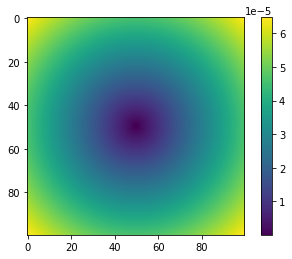

NameError: ignored

In [ ]:
#def get_gaussian_ps(HalfPowerBeamWidth, Orientation):

arrF = get_q_gaussian(2)
  #arrF = get_q_rot_gauss(2)
  

array_x = np.arange(-50,50, 1)

#standardDev = HalfPowerBeamWidth
WAVELENGTH=2
A = np.radians(1)/3600.
F = 2*np.sqrt(2*np.log(2)) 
C = 2*A*F*np.pi
q_gauss = arrF                           ###           setting q
b = q_gauss*z/k

print(arrF.max())
plt.imshow(arrF)
plt.colorbar()
plt.show()



Vis = get_gaussian_visibilities(standardDev, b, 2)
  #Vis = rotatedGaussian(b,standardDev,standardDev,0)
FF_no_rot = FresnelFilterNew(2, q_gauss)
plt.imshow(FF_no_rot)
plt.colorbar()
plt.show()
  #SI = ScintilationIndexNew(Vis,FF)                        ### Only need the positive values for the Power Spectrum
powerSpectrum_p = np.sum(FF_no_rot, axis=0)
powerSpectrum_point = []
for i in powerSpectrum_p: 
  if i > 0:
    powerSpectrum_point.append(i)
plt.loglog(array_x, powerSpectrum_point)
powerSpectrum_s = np.sum(Vis*FF_no_rot, axis=0)
powerSpectrum_source = []
for i in powerSpectrum_s: 
  if i > 0:
    powerSpectrum_source.append(i)
plt.loglog(array_x, powerSpectrum_source)
plt.show()
plt.plot(array_x, powerSpectrum_source)
plt.show()

4.582602949809146e-05


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: RuntimeWarning: invalid value encountered in power


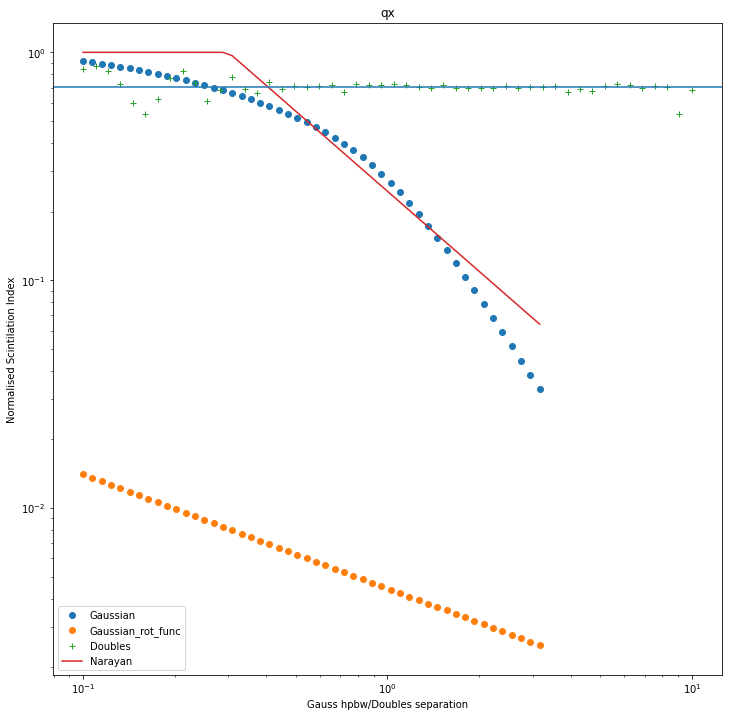

In [3]:
arrF = get_q_rot_gauss(2)
print(arrF.max()) 

array_x = np.arange(-50,50, 1)

standardDev = 0.00002#HalfPowerBeamWidth
WAVELENGTH=2
A = np.radians(1)/3600.
F = 2*np.sqrt(2*np.log(2)) 
C = 2*A*F*np.pi
q_gauss = arrF                           ###           setting q
b = q_gauss*z/k
q_gauss = q_gauss[:,:,0]

arr2 = b[::-1, :, :]
arr3 = b[:,::-1, :]
arr4 = b[::-1, ::-1, :]

arr12 = np.concatenate((b, arr2))
arr34 = np.concatenate((arr3, arr4))
arrFF = np.concatenate((arr12, arr34), axis=1)

#plt.imshow(arrFF[:,:,0])
#plt.show()
#plt.imshow(q_gauss)
#plt.show()

  #Vis = get_gaussian_visibilities(standardDev, b, 2)
Vis = rotatedGaussian(b,standardDev,standardDev,0)
FF_rot = FresnelFilterNew(2, q_gauss)
#print(Vis.max())
#plt.imshow(Vis)
#plt.colorbar()
#plt.show()
#plt.imshow(FF_rot)
#plt.show()

def get_gauss_SI_for_NSI(WAVELENGTH):  # get values for gaussian curve for NSI plot, returns x-values, then y-values


    wavelenght = 2
    r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
    q_new_values = np.linspace(-10/r_F, 10/r_F, 100) 
    qx, qy = np.meshgrid(-q_new_values, -q_new_values)
    q_hypot = np.hypot(qx, qy)   # <- this should work with FF
    arrF = q_hypot

    #arrF = get_q_gaussian(WAVELENGTH)
    standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
    array_x = np.arange(-50,50, 1)
    y_Gvalues = []
    x_Gvalues = []
    for i in range(len(standardDev_range)):
      standardDev = standardDev_range[i]
      A = np.radians(1)/3600.
      F = 2*np.sqrt(2*np.log(2)) 
      C = 2*A*F*np.pi
      q_gauss = arrF                           ###           setting q
      b = q_gauss*z/k
      #plt.imshow(b)
      #plt.show()
      Vis = get_gaussian_visibilities(standardDev, b, 2)
      FF = FresnelFilterNew(2, q_gauss)
      SI = ScintilationIndexNew(Vis,FF)
      powerSpectrum_point = np.sum(FF, axis=0)
      powerSpectrum_source = np.sum(Vis*FF, axis=0)
      #plt.loglog(array_x, powerSpectrum_source)
      #plt.show()
      #plt.plot(array_x, powerSpectrum_source)
      #plt.show()
  
      SInorm = ScintilationIndexNormalisation(FF,SI)

      y_Gvalues.append(SInorm)
      x_Gvalues.append(standardDev)
    return (x_Gvalues,y_Gvalues)


def get_gauss_rot_SI_for_NSI(WAVELENGTH):  # get values for gaussian curve for NSI plot, returns x-values, then y-values
  
    #arrFF = get_q_gaussian(WAVELENGTH)
    #arrF = get_q_rot_gauss(WAVELENGTH)

    wavelenght = 2
    r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
    q_new = np.linspace(10/(r_F), 0.001/r_F, 50)

    arr = np.sqrt(q_new[:, None]**2 + q_new[None, :]**2)
    q_new_values = np.linspace(-10/r_F, 10/r_F, 100) 
    qx, qy = np.meshgrid(-q_new_values, -q_new_values)
    q_hypot = np.hypot(qx, qy)   # <- this should work with FF
    q_rot = np.stack((qx, qy)).swapaxes(0, 2) # <- this should work with rotated
    arrFF = q_hypot
    arrF = q_rot 

    standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
    array_x = np.arange(-50,50, 1)
    y_Gvalues = []
    x_Gvalues = []
    for i in range(len(standardDev_range)):
      standardDev = standardDev_range[i]
      A = np.radians(1)/3600.
      F = 2*np.sqrt(2*np.log(2)) 
      C = 2*A*F*np.pi
      q_gauss = arrF                           ###           setting q
      #b = q_gauss*z/k
      b = q_gauss

      #theta_r = A*standardDev
      #b_hpbw = 2/theta_r
      #Vis = get_gaussian_visibilities(standardDev, b, 2)
      Vis = rotatedGaussian(b,standardDev,standardDev,0)
      #Vis = gauss_for_rotated(Vis)
      FF = FresnelFilterNew(2, arrFF)
      SI = ScintilationIndexNew(Vis,FF)
      powerSpectrum_point = np.sum(FF, axis=0)
      powerSpectrum_source = np.sum(Vis*FF, axis=0)
      #plt.loglog(array_x, powerSpectrum_source)
      #plt.show()
      #plt.plot(array_x, powerSpectrum_source)
      #plt.show()
  
      SInorm = ScintilationIndexNormalisation(FF,SI)

      y_Gvalues.append(SInorm)
      x_Gvalues.append(standardDev)
    return (x_Gvalues,y_Gvalues)

def get_nsi_plot(WAVELENGTH):
    gauss_x,gauss_y = get_gauss_SI_for_NSI(WAVELENGTH)
    gauss_x_r,gauss_y_r = get_gauss_rot_SI_for_NSI(WAVELENGTH)
    #print(gauss_y_r)
    #print(gauss_y)
    double_x, double_y = get_doubles_SI_for_NSI(WAVELENGTH)
    narayan_x, narayan_y = get_narayan_for_NSI()

    plt.figure(figsize=(12,12))
    plt.title('qx')

    plt.loglog(gauss_x,gauss_y , 'o', label="Gaussian")
    plt.plot(gauss_x_r,gauss_y_r , 'o', label="Gaussian_rot_func")
    plt.loglog(double_x, double_y, '+', label="Doubles")
    plt.loglog(narayan_x, narayan_y, label="Narayan")

    plt.axhline(y=(1/np.sqrt(2)))
    plt.xlabel("Gauss hpbw/Doubles separation")
    plt.ylabel("Normalised Scintilation Index")
    plt.legend()
    plt.show()


get_nsi_plot(2)

sigma:  0.1


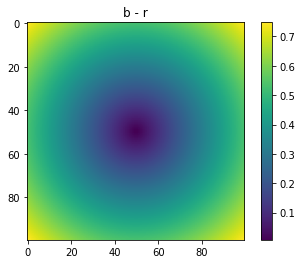

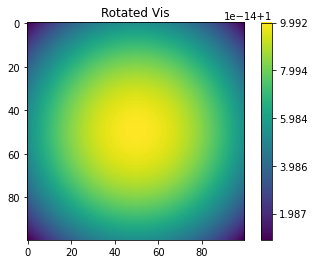

sigma:  0.10730309405261562


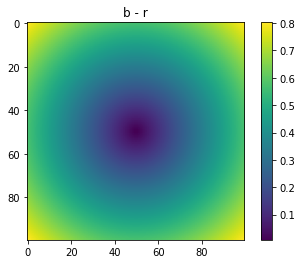

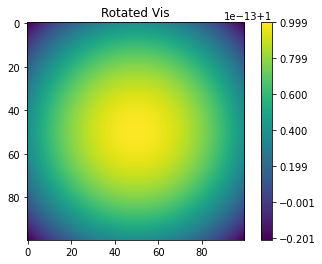

sigma:  0.11513953993264472


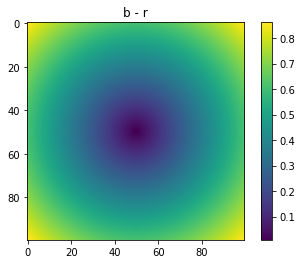

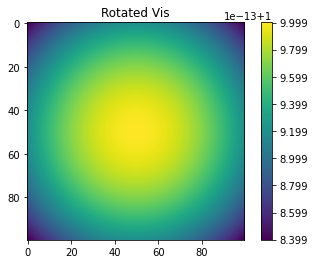

sigma:  0.12354828882567469


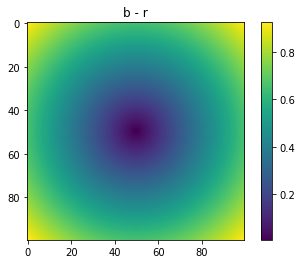

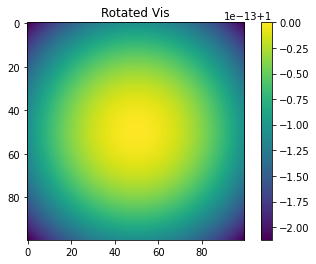

sigma:  0.13257113655901093


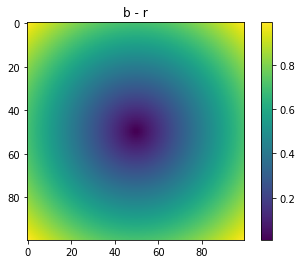

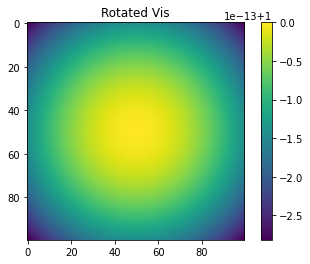

sigma:  0.14225293134853698


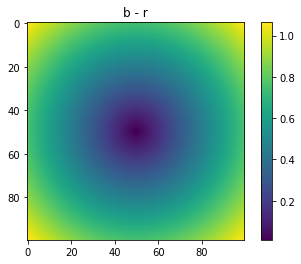

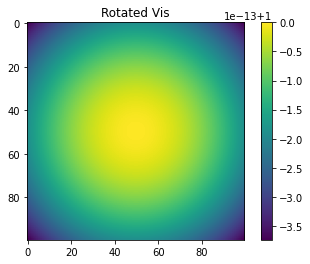

sigma:  0.15264179671752334


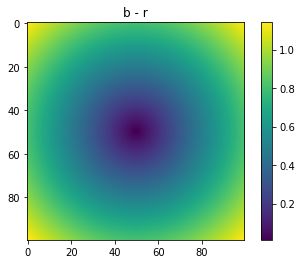

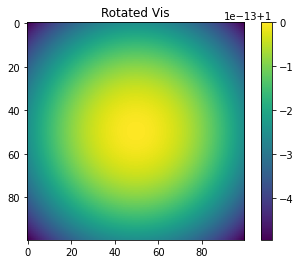

sigma:  0.16378937069540642


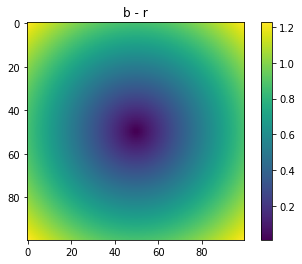

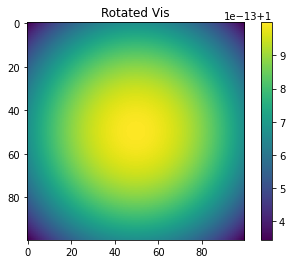

sigma:  0.1757510624854792


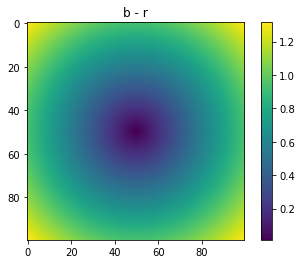

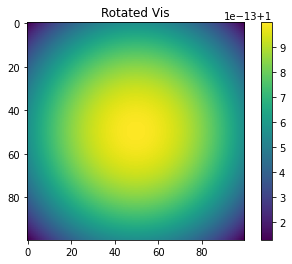

sigma:  0.18858632787726495


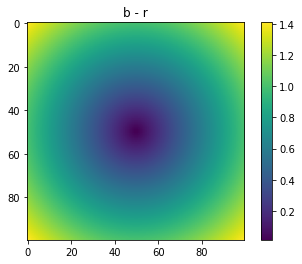

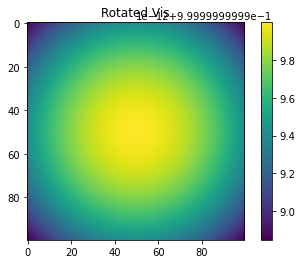

sigma:  0.20235896477251572


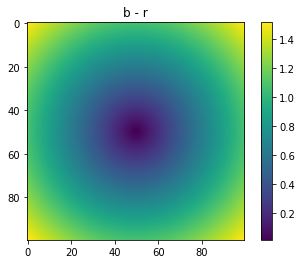

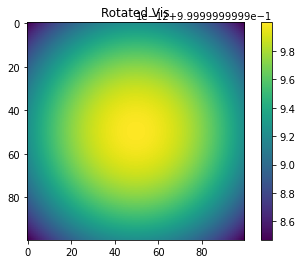

sigma:  0.21713743029375185


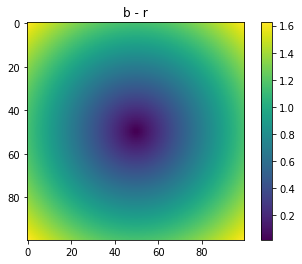

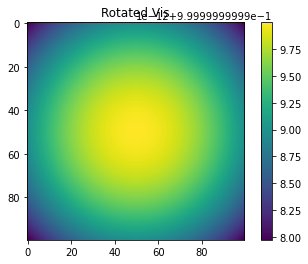

sigma:  0.2329951810515372


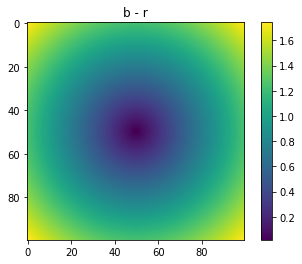

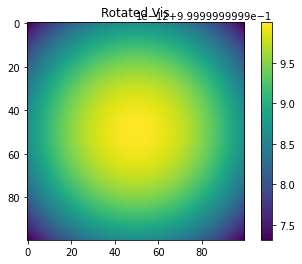

sigma:  0.250011038261793


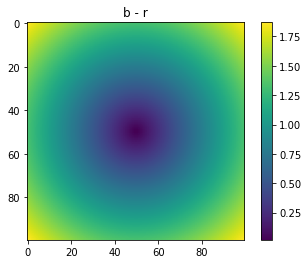

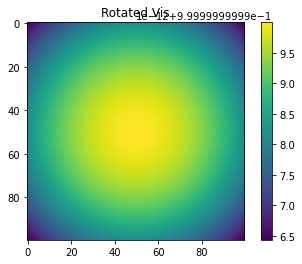

sigma:  0.2682695795279726


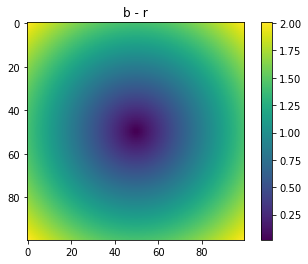

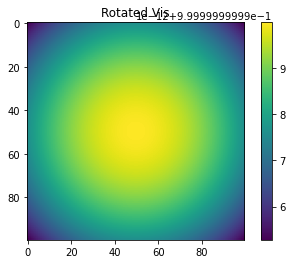

sigma:  0.2878615592354568


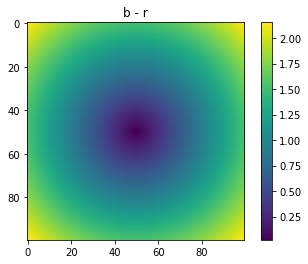

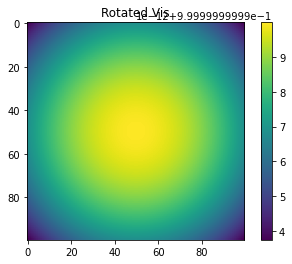

sigma:  0.3088843596477481


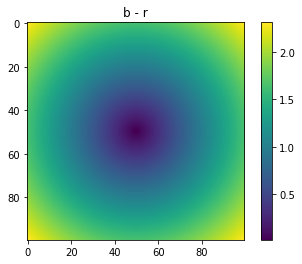

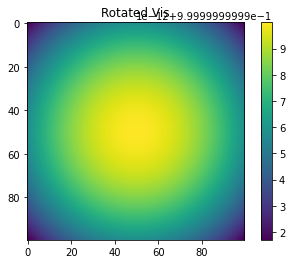

sigma:  0.33144247494664264


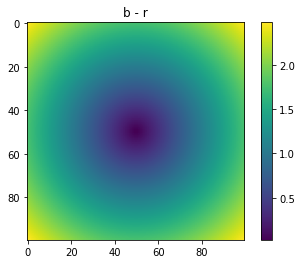

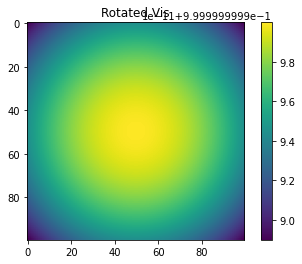

sigma:  0.35564803062231287


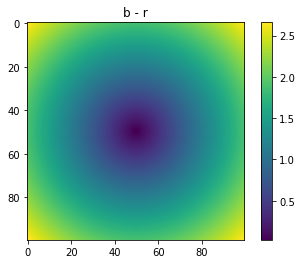

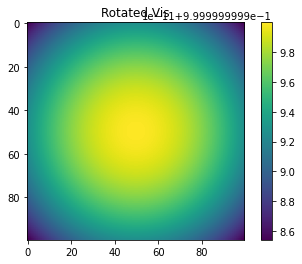

sigma:  0.3816213407949356


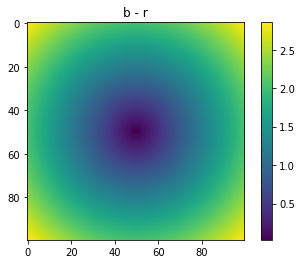

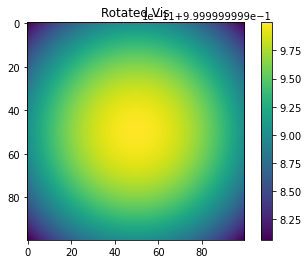

sigma:  0.40949150623804254


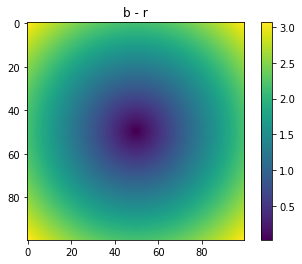

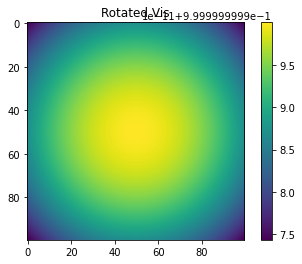

sigma:  0.43939705607607904


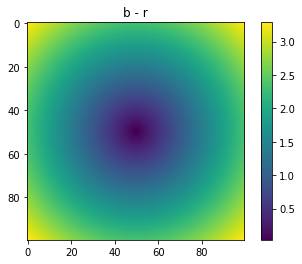

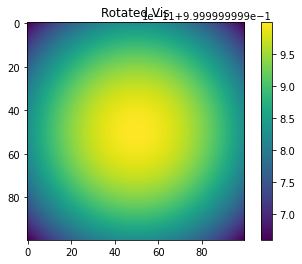

sigma:  0.47148663634573934


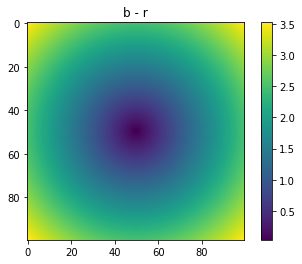

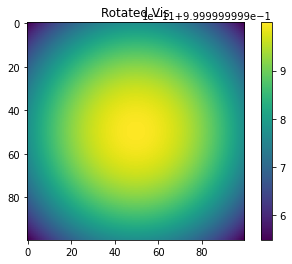

sigma:  0.5059197488435825


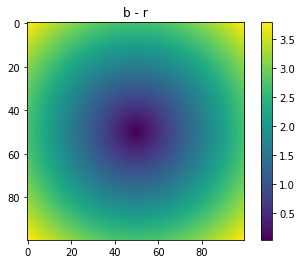

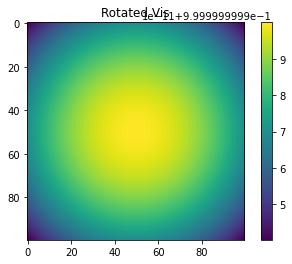

sigma:  0.5428675439323859


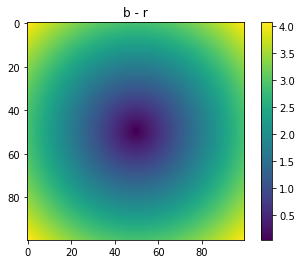

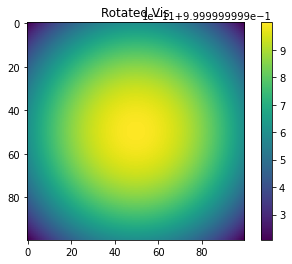

sigma:  0.5825136712468926


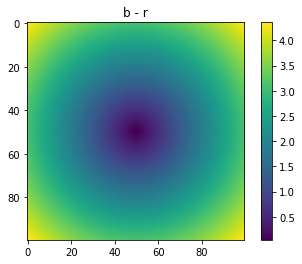

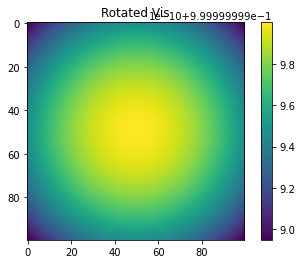

sigma:  0.6250551925273973


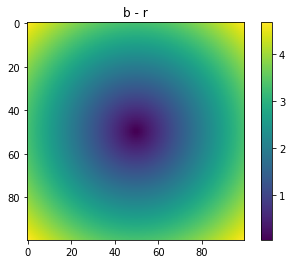

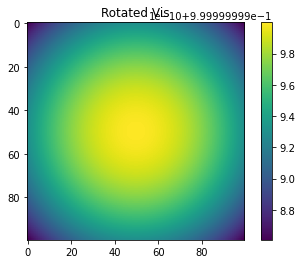

sigma:  0.6707035611184308


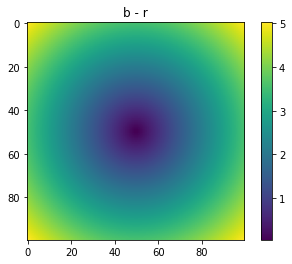

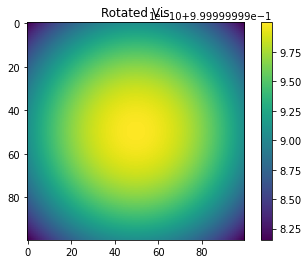

sigma:  0.7196856730011519


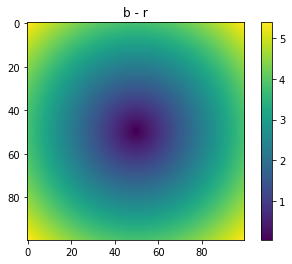

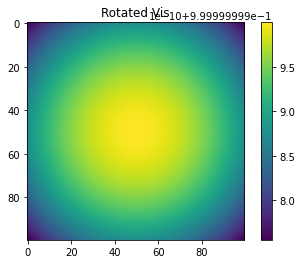

sigma:  0.7722449945836258


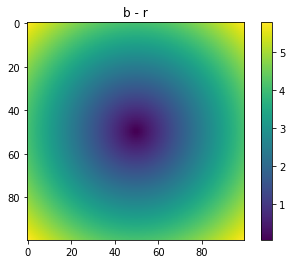

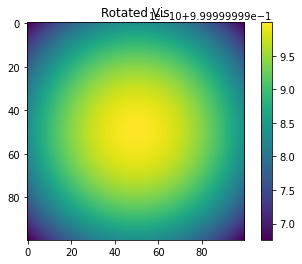

sigma:  0.8286427728546845


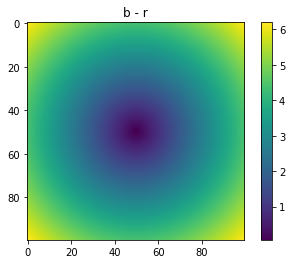

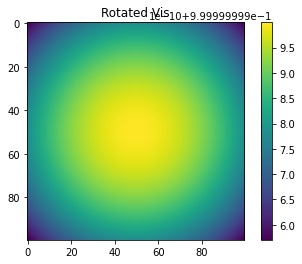

sigma:  0.889159333916464


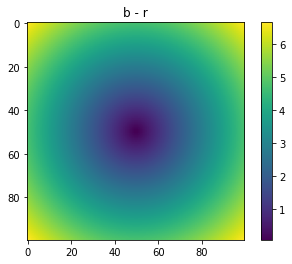

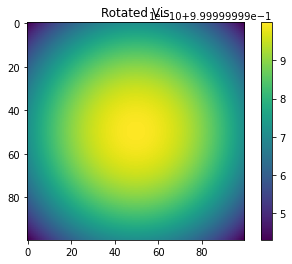

sigma:  0.9540954763499939


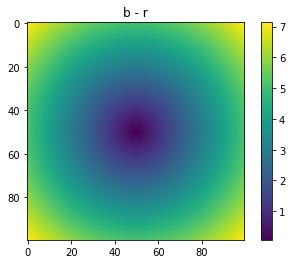

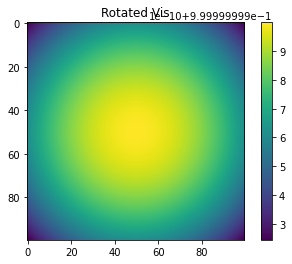

sigma:  1.0237739663395848


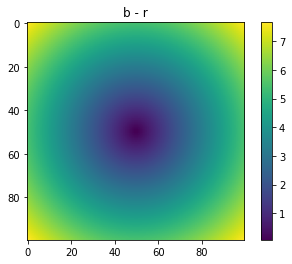

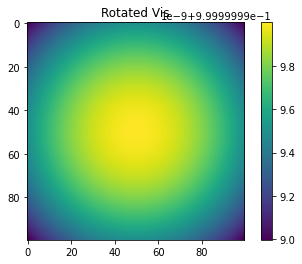

sigma:  1.0985411419875584


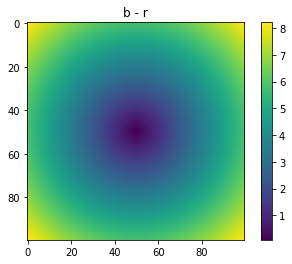

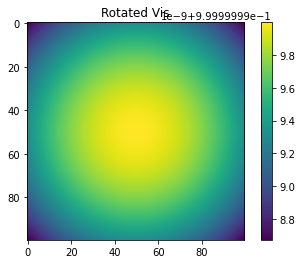

sigma:  1.1787686347935873


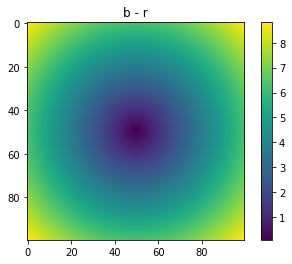

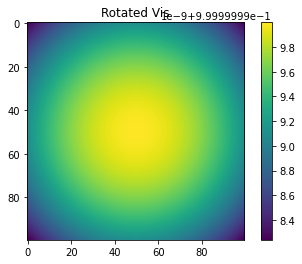

sigma:  1.2648552168552958


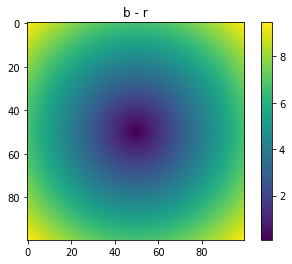

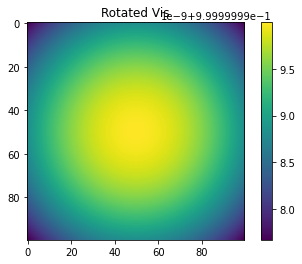

sigma:  1.3572287829716538


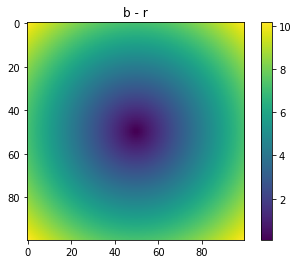

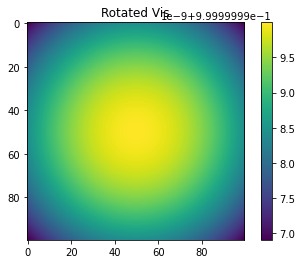

sigma:  1.4563484775012436


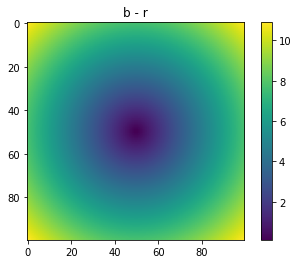

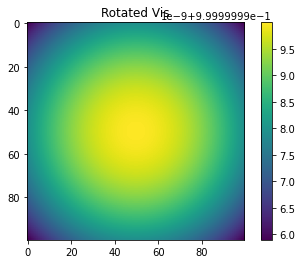

sigma:  1.5627069765469948


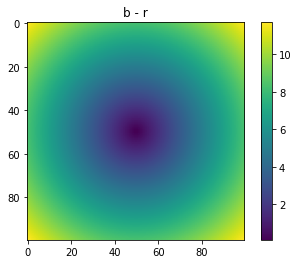

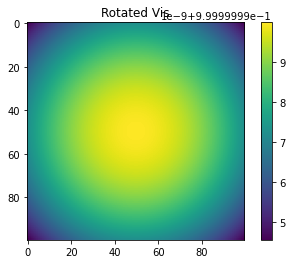

sigma:  1.6768329368110082


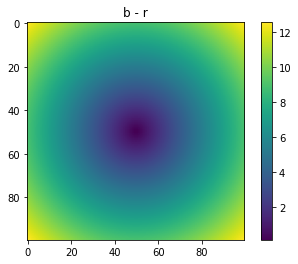

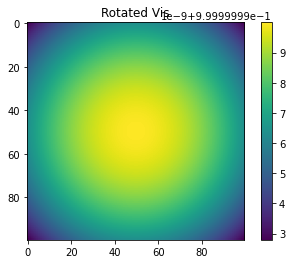

sigma:  1.7992936232915524


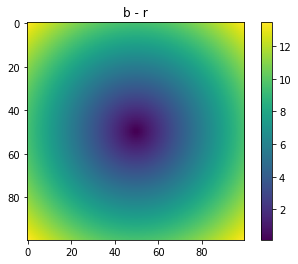

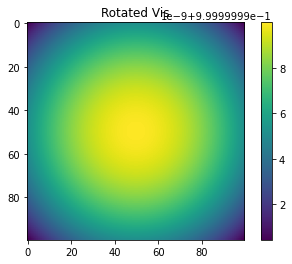

sigma:  1.9306977288832496


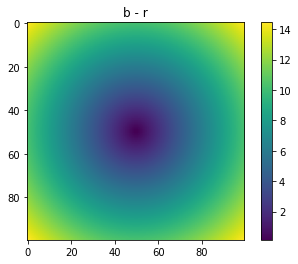

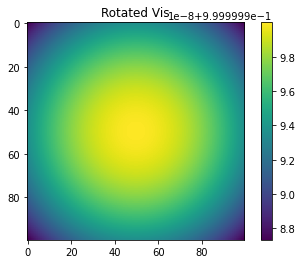

sigma:  2.0716983998953076


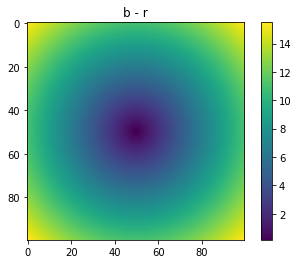

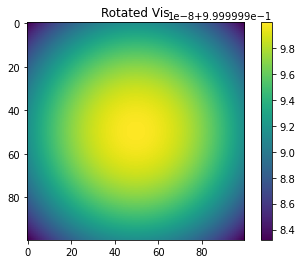

sigma:  2.2229964825261943


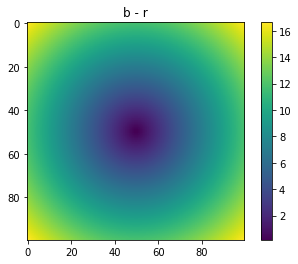

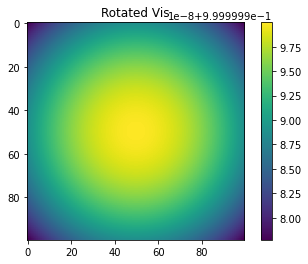

sigma:  2.385344006431419


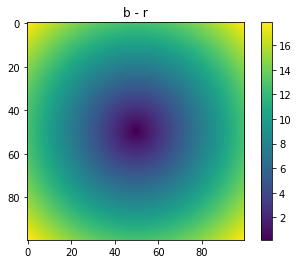

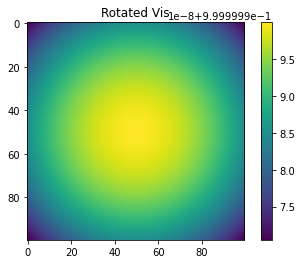

sigma:  2.5595479226995357


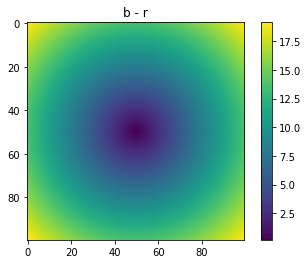

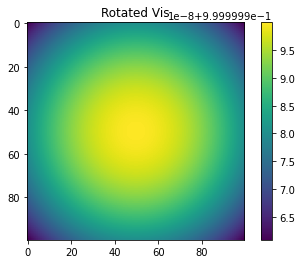

sigma:  2.746474114816052


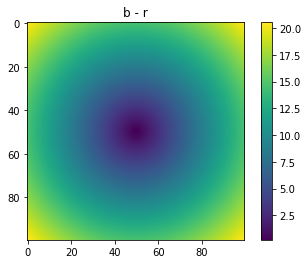

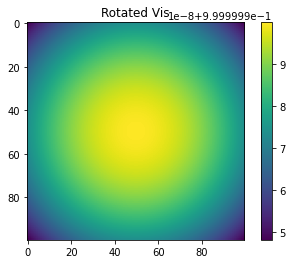

sigma:  2.9470517025518097


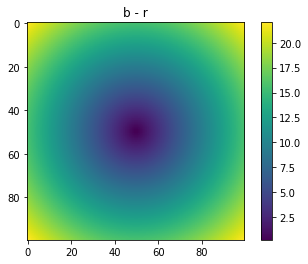

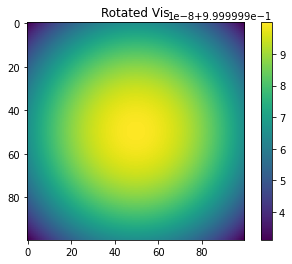

sigma:  3.1622776601683795


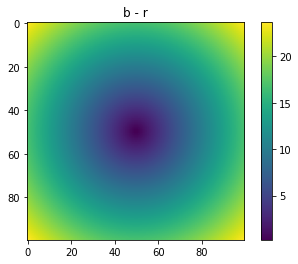

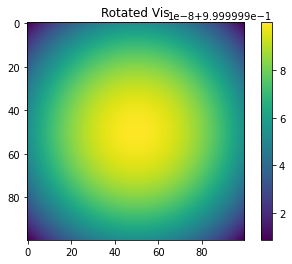

In [ ]:
def rotatedGaussian(offset, sigma_a, sigma_b, pa):
    """
    return offset in sigma from an elliptical Gaussian centred on (x0
    offset:           numpy array of coordinates ( e.g. array([[x1, y
    sigma_a, sigma_b: major and minor axes of gaussian
    pa:               position angle of guassian measured from y axis
                      defined by sigma_a, sigma_b and pa (in degrees)
    return normalised offset in standard deviations (sigma) for each 
    xy_offset_to_gaussian(((1.0, 0.0),), 1.0, 0.5, 0.0)
    >>> array([ 1.])
    """

    pa = pa*np.pi/180
    
    sigma_array = np.zeros(offset[..., 0].shape, dtype=complex)
    sigma_array.real = offset[..., 0]
    sigma_array.imag = offset[..., 1]
    rot = complex(np.cos(-pa), np.sin(-pa))
    sigma_array *= rot
    sigma_array.real /= sigma_a
    sigma_array.imag /= sigma_b
    final = np.abs(sigma_array).astype(float)
    #final = final/10
    return final

def gauss_for_rotated(offset_sigma, hpbw, w=2):
    '''
    Auxilary function that does not require normalisation 
    '''
    #offset_sigma = offset_sigma/10
    A = np.radians(1)/3600.
    F = 2* np.sqrt(2*np.log(2))
    #return np.exp(-0.5*(F*offset_sigma)**2)
    theta_r = A*hpbw
    b_hpbw = w/theta_r
    return np.exp(-0.5*(F*offset_sigma/b_hpbw)**2)
    #np.exp(-0.5*(F*b/b_hpbw)**2)

def get_gaussian_visibilities(theta_s, b, w=2): # theta_s = hpbw
    """
    produce 1D gaussian for
    - Gaussian FWHM theta_s (in arcseconds)
    - 2d array of baseline lengths b ( in m)
    - wavelength in m
    """
    A = np.radians(1)/3600.
    F = 2*np.sqrt(2*np.log(2))
    theta_r = A*theta_s
    b_hpbw = w/theta_r
    #print(b_hpbw)
    return np.exp(-0.5*(F*b/b_hpbw)**2)



## Rotated ##






wavelenght = 2
r_F = np.sqrt((wavelenght*z)/(2*pi)) # np.sqrt((z/k)=(wavelenght*z)/(2*pi))
q_new = np.linspace(10/(r_F), 0.001/r_F, 50)

arr = np.sqrt(q_new[:, None]**2 + q_new[None, :]**2)
q_new_values = np.linspace(-10/r_F, 10/r_F, 100) 
qx, qy = np.meshgrid(-q_new_values, -q_new_values)
q_hypot = np.hypot(qx, qy)   # <- this should work with FF
q_rot = np.stack((qx, qy)).swapaxes(0, 2) # <- this should work with rotated
arrFF = q_hypot
arrF = q_rot 

standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
array_x = np.arange(-50,50, 1)
y_Gvalues = []
x_Gvalues = []
for i in range(len(standardDev_range)):
  standardDev = standardDev_range[i]
  A = np.radians(1)/3600.
  F = 2*np.sqrt(2*np.log(2)) 
  C = 2*A*F*np.pi
  q_gauss = arrF                           ###           setting q
  b = q_gauss*z/k
  #b = q_gauss
  

  #theta_r = A*standardDev
  #b_hpbw = 2/theta_r
  #Vis = get_gaussian_visibilities(standardDev, b, 2)
  A = np.radians(1)/3600.
  F = 2* np.sqrt(2*np.log(2))
    #return np.exp(-0.5*(F*offset_sigma)**2)
  theta_r = A*standardDev
  b_hpbw = 2/theta_r
  Vis = rotatedGaussian(b,b_hpbw,b_hpbw,0)
  print('sigma: ', standardDev)
  plt.imshow(Vis)
  plt.colorbar()
  plt.title('b - r')
  plt.show()

  #print(Vis)
  #plt.imshow(Vis)
  #plt.colorbar()
  #plt.title('Rotated Vis')
  #plt.show()
  Vis = gauss_for_rotated(Vis, standardDev)
  #print(Vis)
  plt.imshow(Vis)
  plt.colorbar()
  plt.title('Rotated Vis')
  plt.show()

  #Vis = gauss_for_rotated(Vis)
  #FF = FresnelFilterNew(2, arrFF)
  #SI = ScintilationIndexNew(Vis,FF)
  #powerSpectrum_point = np.sum(FF, axis=0)
  #powerSpectrum_source = np.sum(Vis*FF, axis=0)
      #plt.loglog(array_x, powerSpectrum_source)
      #plt.show()
      #plt.plot(array_x, powerSpectrum_source)
      #plt.show()
  
  #SInorm = ScintilationIndexNormalisation(FF,SI)

  #y_Gvalues.append(SInorm)
  #x_Gvalues.append(standardDev)



In [ ]:
a = GaussHPBWVariationsLog(-1,0.5,50) 
print(a)

[0.1        0.10730309 0.11513954 0.12354829 0.13257114 0.14225293
 0.1526418  0.16378937 0.17575106 0.18858633 0.20235896 0.21713743
 0.23299518 0.25001104 0.26826958 0.28786156 0.30888436 0.33144247
 0.35564803 0.38162134 0.40949151 0.43939706 0.47148664 0.50591975
 0.54286754 0.58251367 0.62505519 0.67070356 0.71968567 0.77224499
 0.82864277 0.88915933 0.95409548 1.02377397 1.09854114 1.17876863
 1.26485522 1.35722878 1.45634848 1.56270698 1.67683294 1.79929362
 1.93069773 2.0716984  2.22299648 2.38534401 2.55954792 2.74647411
 2.9470517  3.16227766]


sigma:  0.1


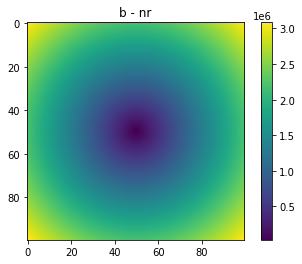

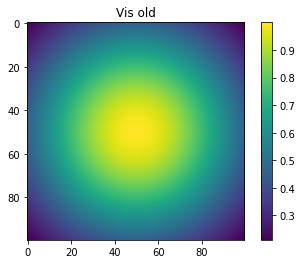

sigma:  0.10730309405261562


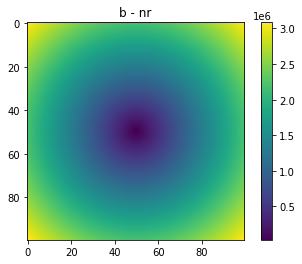

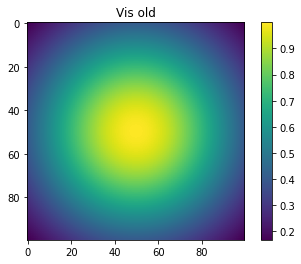

sigma:  0.11513953993264472


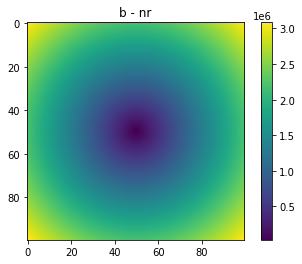

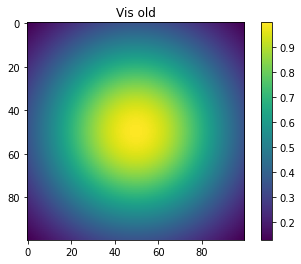

sigma:  0.12354828882567469


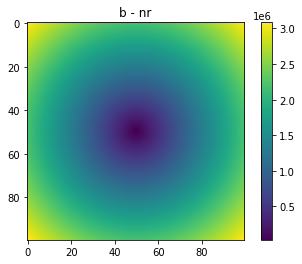

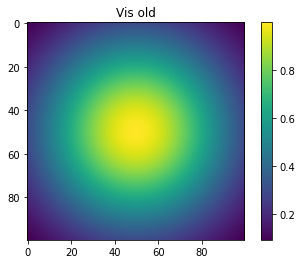

sigma:  0.13257113655901093


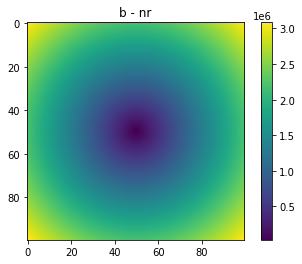

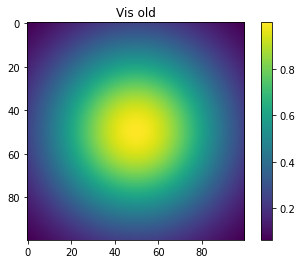

sigma:  0.14225293134853698


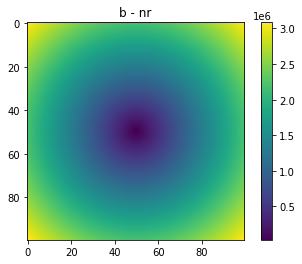

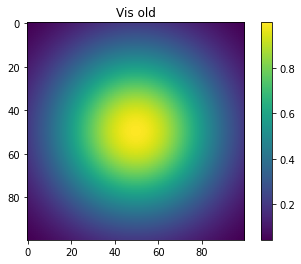

sigma:  0.15264179671752334


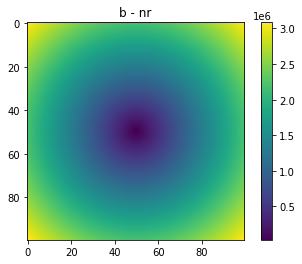

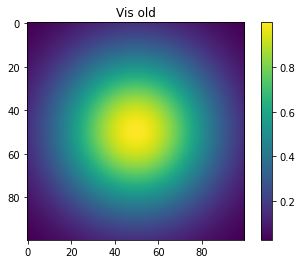

sigma:  0.16378937069540642


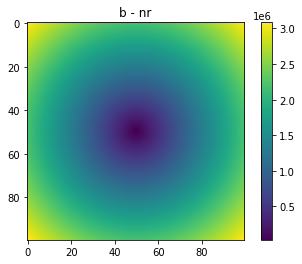

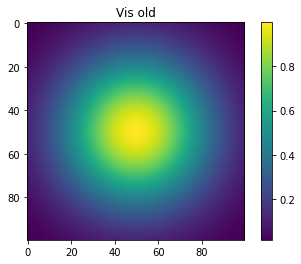

sigma:  0.1757510624854792


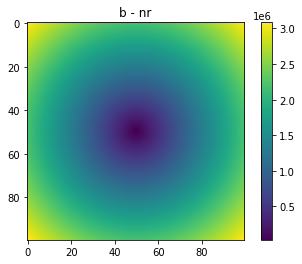

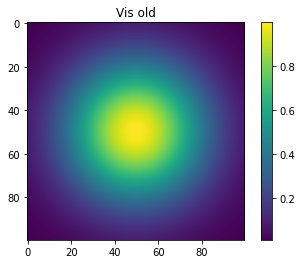

sigma:  0.18858632787726495


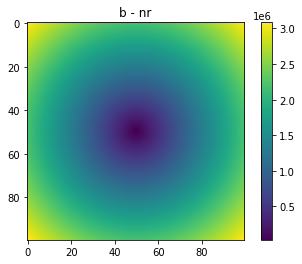

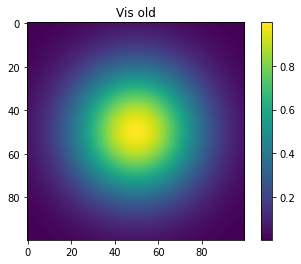

sigma:  0.20235896477251572


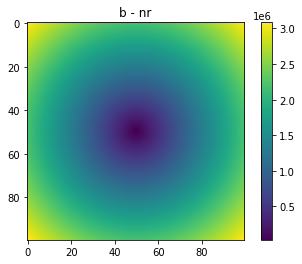

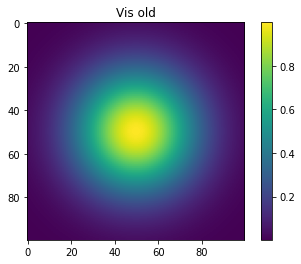

sigma:  0.21713743029375185


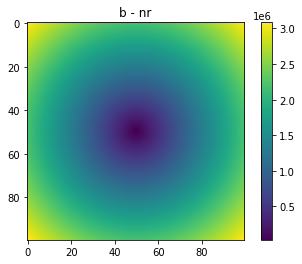

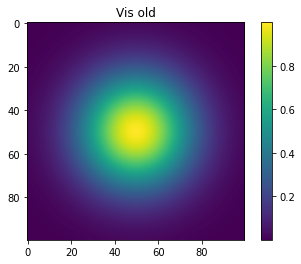

sigma:  0.2329951810515372


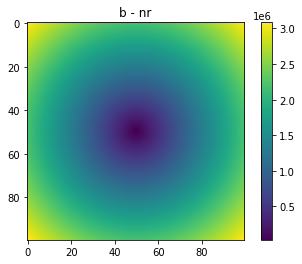

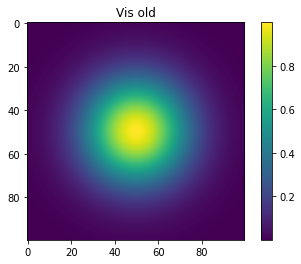

sigma:  0.250011038261793


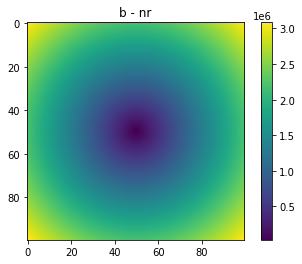

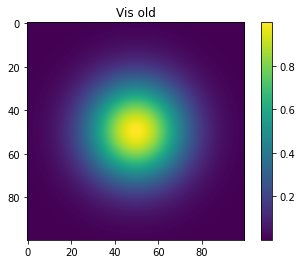

sigma:  0.2682695795279726


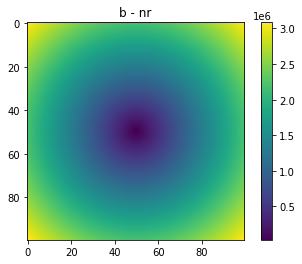

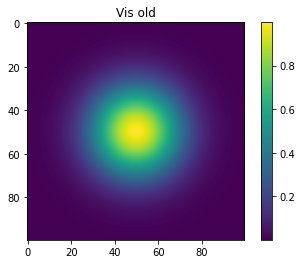

sigma:  0.2878615592354568


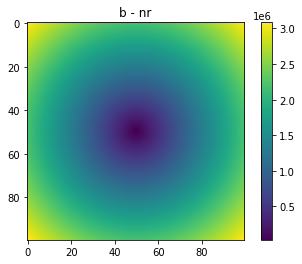

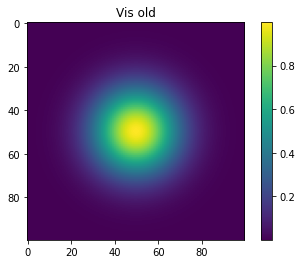

sigma:  0.3088843596477481


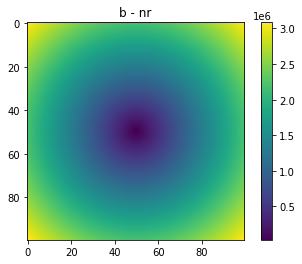

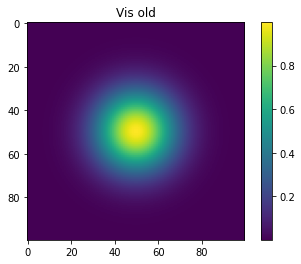

sigma:  0.33144247494664264


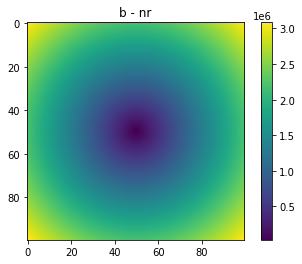

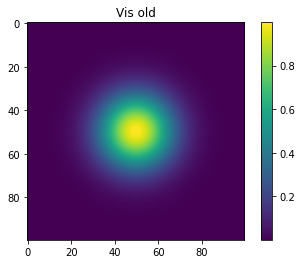

sigma:  0.35564803062231287


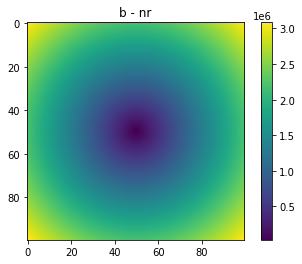

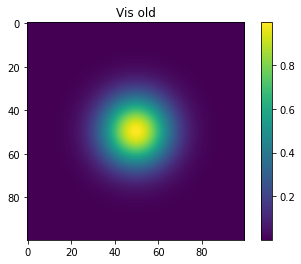

sigma:  0.3816213407949356


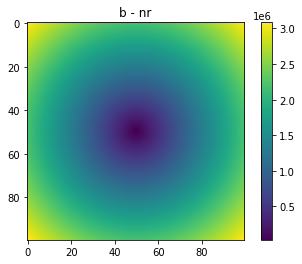

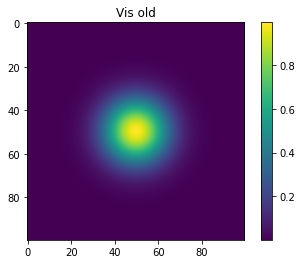

sigma:  0.40949150623804254


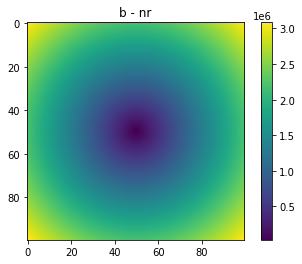

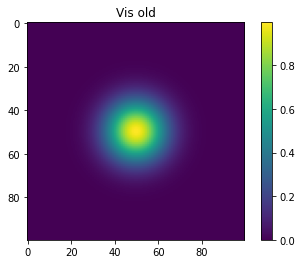

sigma:  0.43939705607607904


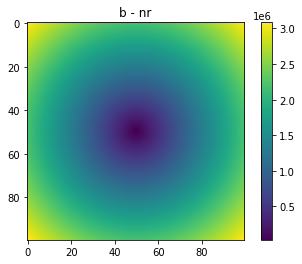

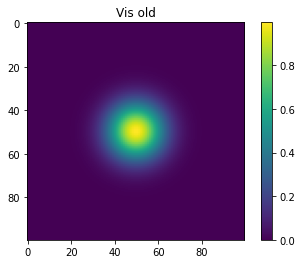

sigma:  0.47148663634573934


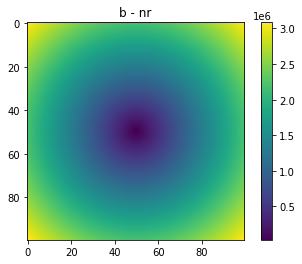

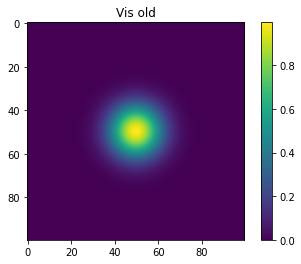

sigma:  0.5059197488435825


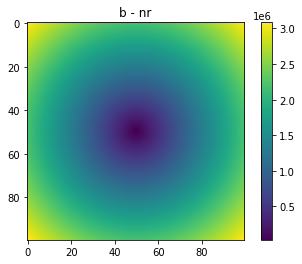

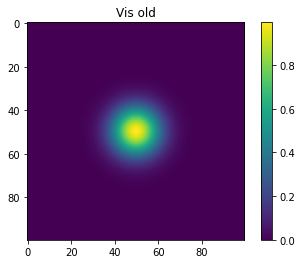

sigma:  0.5428675439323859


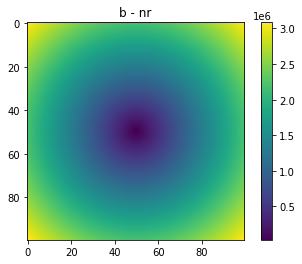

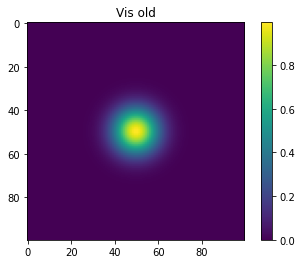

sigma:  0.5825136712468926


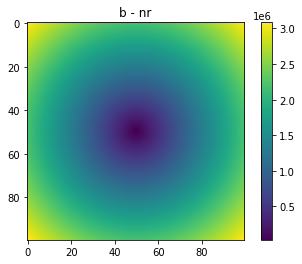

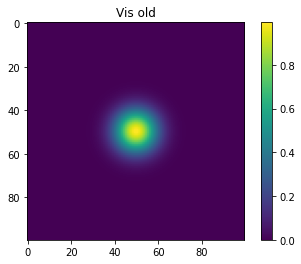

sigma:  0.6250551925273973


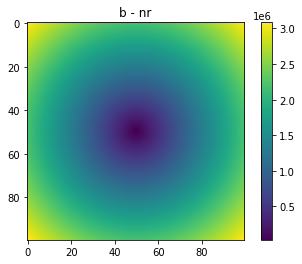

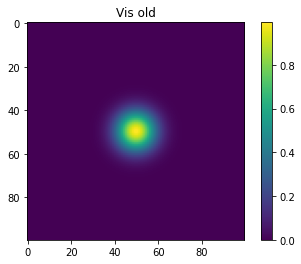

sigma:  0.6707035611184308


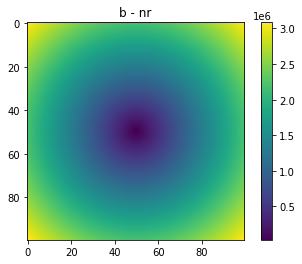

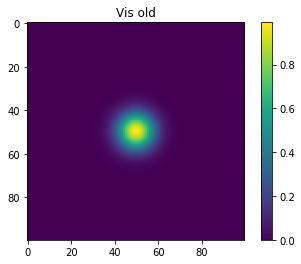

sigma:  0.7196856730011519


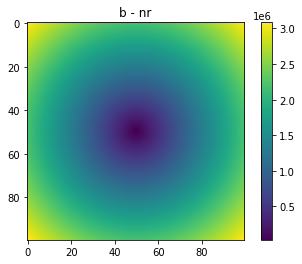

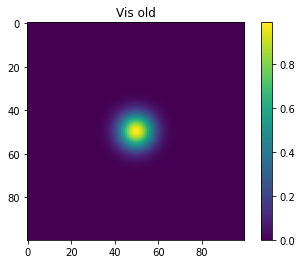

sigma:  0.7722449945836258


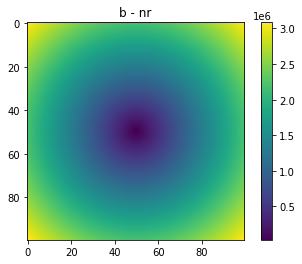

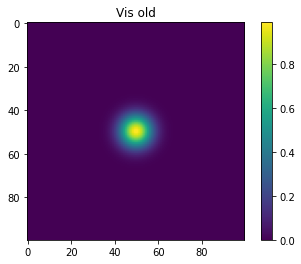

sigma:  0.8286427728546845


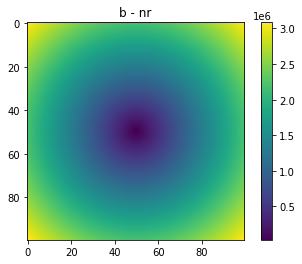

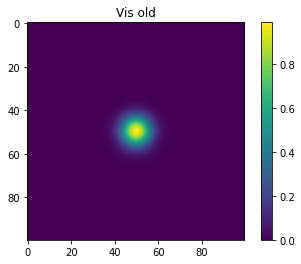

sigma:  0.889159333916464


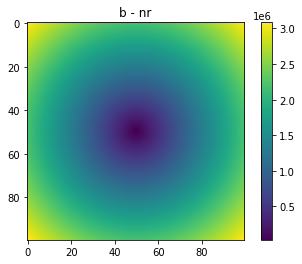

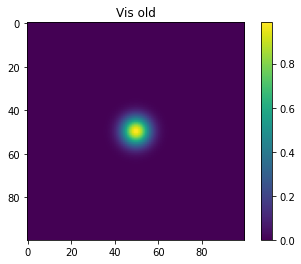

sigma:  0.9540954763499939


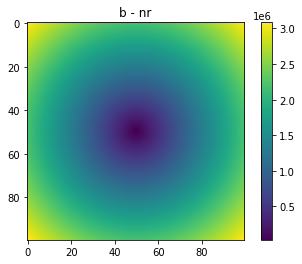

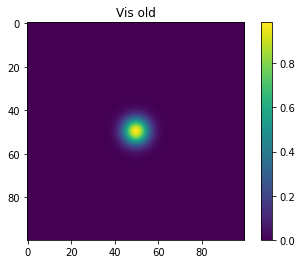

sigma:  1.0237739663395848


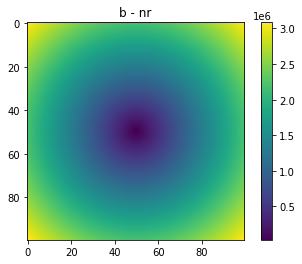

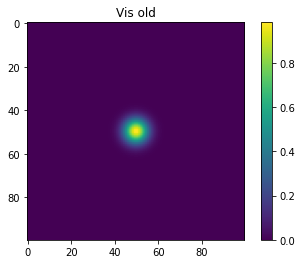

sigma:  1.0985411419875584


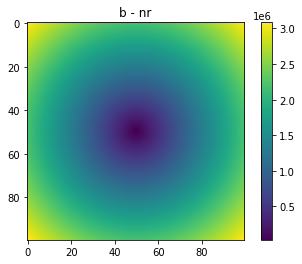

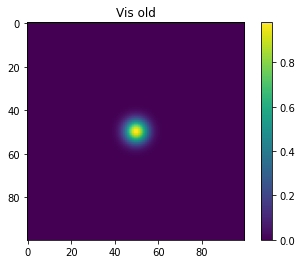

sigma:  1.1787686347935873


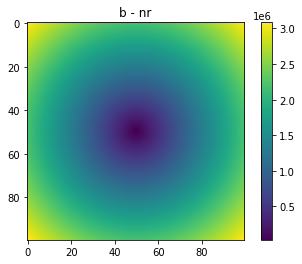

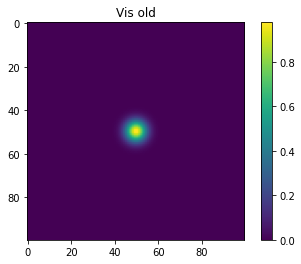

sigma:  1.2648552168552958


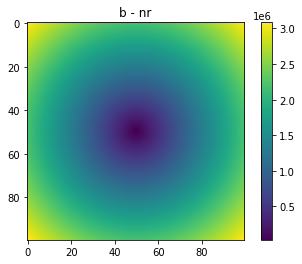

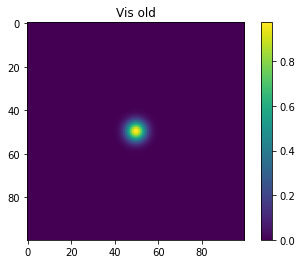

sigma:  1.3572287829716538


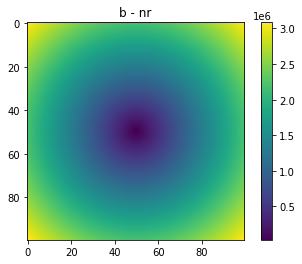

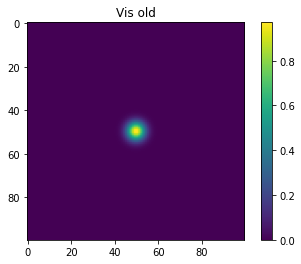

sigma:  1.4563484775012436


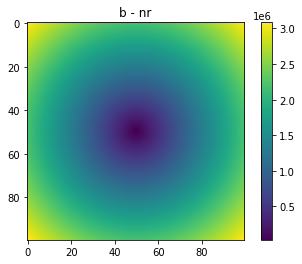

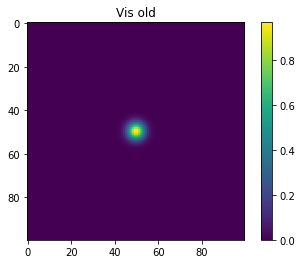

sigma:  1.5627069765469948


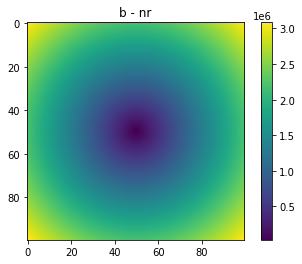

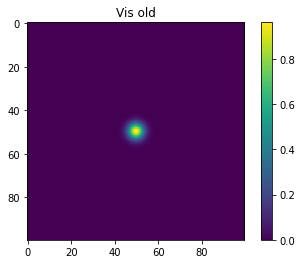

sigma:  1.6768329368110082


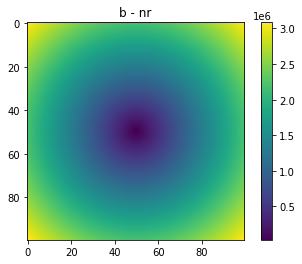

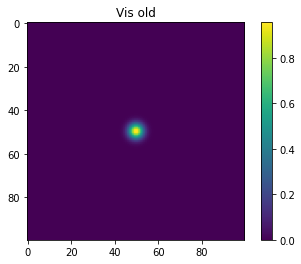

sigma:  1.7992936232915524


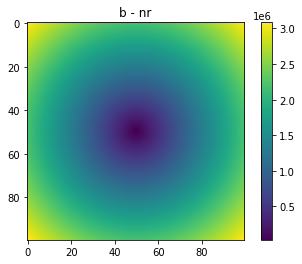

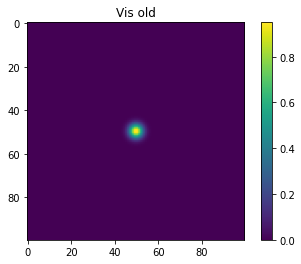

sigma:  1.9306977288832496


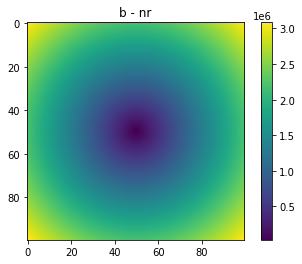

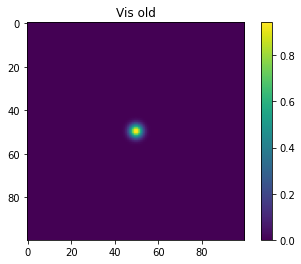

sigma:  2.0716983998953076


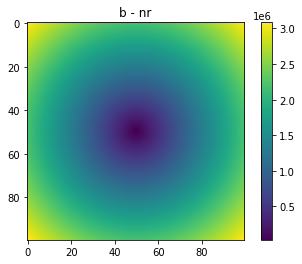

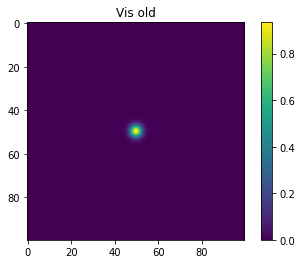

sigma:  2.2229964825261943


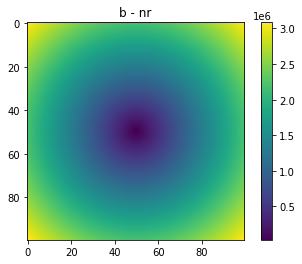

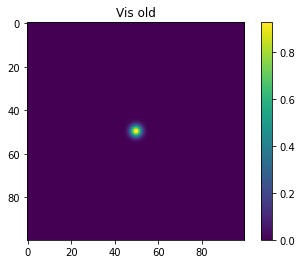

sigma:  2.385344006431419


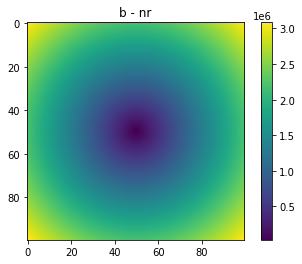

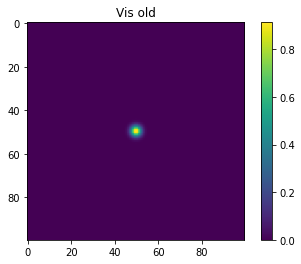

sigma:  2.5595479226995357


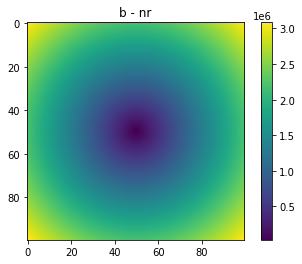

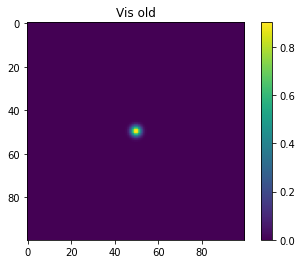

sigma:  2.746474114816052


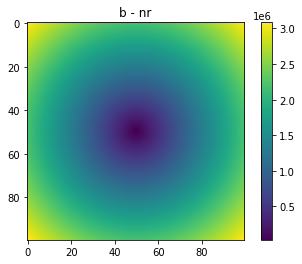

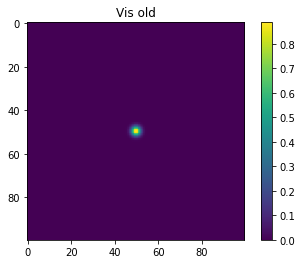

sigma:  2.9470517025518097


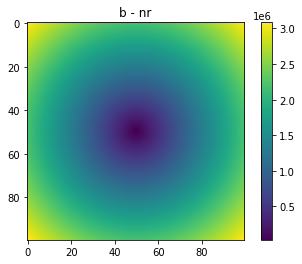

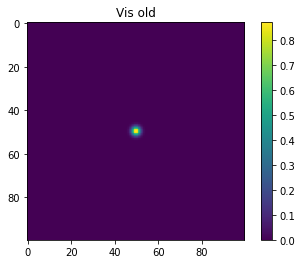

sigma:  3.1622776601683795


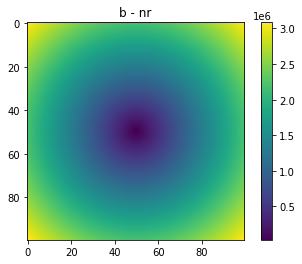

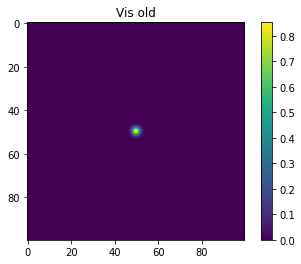

In [ ]:
## not rotated ##

arrF = arrFF
#arrF = get_q_gaussian(WAVELENGTH)
standardDev_range = GaussHPBWVariationsLog(-1,0.5,50)
array_x = np.arange(-50,50, 1)
y_Gvalues = []
x_Gvalues = []
for i in range(len(standardDev_range)):
  standardDev = standardDev_range[i]
  A = np.radians(1)/3600.
  F = 2*np.sqrt(2*np.log(2)) 
  C = 2*A*F*np.pi
  q_gauss = arrF                           ###           setting q
  b = q_gauss*z/k
  print('sigma: ', standardDev)
  plt.imshow(b)
  plt.colorbar()
  plt.title('b - nr')
  plt.show()
  Vis = get_gaussian_visibilities(standardDev, b, 2)
  #print(Vis)
  plt.imshow(Vis)
  plt.colorbar()
  plt.title('Vis old')
  plt.show()

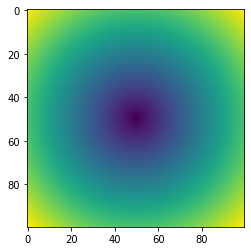


 offset function 

Pos shape is  (2, 100, 100)
Pos shape is  (100, 100, 2)
test shape=(100, 100)


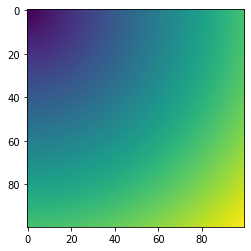

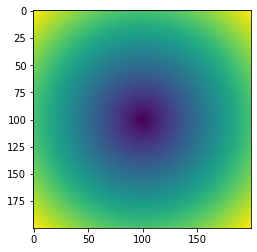

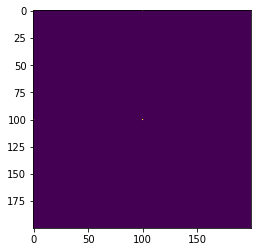

Test values:  [[0.00000000e+00 4.71422964e+12 4.66661116e+12 ... 4.61899268e+12
  4.66661116e+12 4.71422964e+12]
 [4.71422964e+12 6.66692749e+12 6.63334160e+12 ... 6.59992837e+12
  6.63334160e+12 6.66692749e+12]
 [4.66661116e+12 6.63334160e+12 6.59958479e+12 ... 6.56599977e+12
  6.59958479e+12 6.63334160e+12]
 ...
 [4.61899268e+12 6.59992837e+12 6.56599977e+12 ... 6.53224209e+12
  6.56599977e+12 6.59992837e+12]
 [4.66661116e+12 6.63334160e+12 6.59958479e+12 ... 6.56599977e+12
  6.59958479e+12 6.63334160e+12]
 [4.71422964e+12 6.66692749e+12 6.63334160e+12 ... 6.59992837e+12
  6.63334160e+12 6.66692749e+12]]
Pre-Test values:  [[3086048.64497805 3054723.78586504 3023730.20249042 ... 3023730.20249042
  3054723.78586504 3086048.64497805]
 [3054723.78586504 3023074.35844513 2991752.91530091 ... 2991752.91530091
  3023074.35844513 3054723.78586504]
 [3023730.20249042 2991752.91530091 2960100.0719122  ... 2960100.0719122
  2991752.91530091 3023730.20249042]
 ...
 [3023730.20249042 2991752.9153

In [ ]:
                ### TESTING FUNCTIONS ###
                    # get_double_ps #
                    # 

#separation_range = np.logspace(-1,1, 50) 
#print(separation_range)


#get_double_ps(0.3,30)


                    # Gaussian's elliptical #

def xy_offset_to_gaussian(offset, sigma_a, sigma_b, pa=0.):
    """
    return offset in sigma from an elliptical Gaussian centred on (x0, y0). 
    offset:           numpy array of coordinates ( e.g. array([[x1, y1],[x2, y2]]))
    sigma_a, sigma_b: major and minor axes of gaussian
    pa:               position angle of guassian measured from y axis
                      defined by sigma_a, sigma_b and pa (in radians),
    return normalised offset in standard deviations (sigma) for each coordinate
    xy_offset_to_gaussian(((1.0, 0.0),), 1.0, 0.5, 0.0)
    >>> array([ 1.]) 
    """
    #print(np.shape(offset))
    #sigma_array = np.zeros(np.shape(offset)[:2], dtype=complex) # Tim's code
    #sigma_array = np.zeros(np.shape(offset)[0], dtype=complex)
    sigma_array = np.zeros(offset[..., 0].shape, dtype=complex)
    #print('sigma array shape is ', sigma_array.shape)
    sigma_array.real = offset[..., 0]
    sigma_array.imag = offset[..., 1]
    
    rot = complex(cos(-pa), sin(-pa))
    
    sigma_array *= rot
    sigma_array.real /= sigma_a
    sigma_array.imag /= sigma_b

    return abs(sigma_array).astype(float)



arrF = get_q_gaussian(2)
array_x = np.arange(-50,50, 1)

standardDev = 0.1
WAVELENGTH=2
A = np.radians(1)/3600.
F = 2*np.sqrt(2*np.log(2)) 
C = 2*A*F*np.pi
q_gauss = arrF
#plt.imshow(q_gauss)
#plt.show()                       ###           setting q
b = q_gauss*z/k

plt.imshow(b)
plt.show()
#print(b.ndim)
print('\n offset function \n')
#print(f' b ={b}')

ogx = np.linspace(0,99, num=100)
ogy = np.linspace(0,99, num=100)

x_pos, y_pos = np.meshgrid(ogx, ogy)
#print(x_pos.shape, x_pos.flatten().shape)

pos = np.array((x_pos, y_pos))
print('Pos shape is ', pos.shape)
print('Pos shape is ', (np.swapaxes(pos,2,0)).shape)


test = xy_offset_to_gaussian(
    np.swapaxes(pos,2,0),
    1,
    1,
    0

)

#print(test)
print(f'test shape={test.shape}')

# test = xy_offset_to_gaussian(
#     np.array([(x, y) for x,y in zip(ogx, ogy)]),
#     1,
#     1,
#     0

# )

#print('Worked')

#print(ogx, '\n shape of ogx: ', ogx.shape)
# idx = []
# idy = []
# for i in ogx:
#   for ii in ogy:
#     tempx,tempy = xy_offset_to_gaussian(np.array((i, ii)), 1.0, 0.5)
#     idx.append(tempx)
#     idx.append(tempy)


#print(f'idx={idx}')
#print(f'idy={idy}')


#b_double_dash = b[idx,idy]


plt.imshow(test)
plt.show()
arr = test

arr1 = np.empty((100,100))
arrx = np.empty((100,100))
for x in range(100):
  for y in range(100):
    arr1[x,y] = arr[-x,-y]
    arrx[x,y] = arr[x,-y]
arr2 = np.concatenate((arr1, arrx))


plt.imshow(arr2)
plt.plot()

arr3 = np.empty((200,100))
for x in range(200):
  for y in range(100):
    arr3[x,y] = arr2[x,-y]
arr4 = np.concatenate((arr2, arr3), axis=1)


#plt.imshow(arr4)
#plt.show()

q_gauss = arr4                         
b_dash = q_gauss*z/k

plt.imshow(b_dash)
plt.show()


#b_dash = xy_offset_to_gaussian(b,3,0.5) # x to create a gaussian 

#rint('Shape of b.dash', b_dash.shape)
#print('Shape of b', b.shape)

gaussian = np.exp(-0.5*(b_dash**2))
#print(gaussian)
plt.imshow(gaussian)
plt.show()

print('Test values: ', b_dash)
print('Pre-Test values: ', b)
print('Gaussian values: ', gaussian)


#print(b_dash.shape)
#plt.plot(np.sum(b,axis=1))

#plt.imshow(test)
#plt.show()
#plt.plot(b_dash)
#plt.show()





#q_new_values = b_dash
#arr = np.sqrt(q_new_values[:, None]**2 + q_new_values[None, :]**2)

#plt.imshow(arr)
#plt.show()

#Vis = get_gaussian_visibilities(standardDev, b, 2)
#plt.imshow(Vis)
#plt.show()

#Vis = get_gaussian_visibilities(standardDev, arr, 2)
#plt.imshow(Vis)
#plt.show()

#b_tup = tuple(map(tuple, b))
#print(b_tup)

b


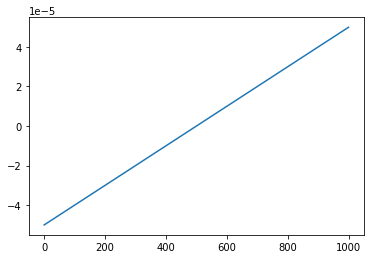

double image


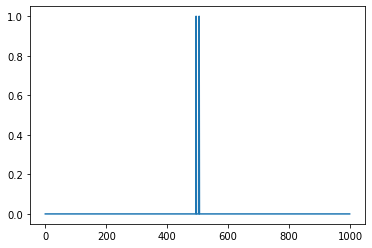

vis scale3


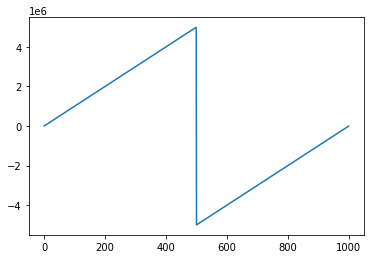

vis3


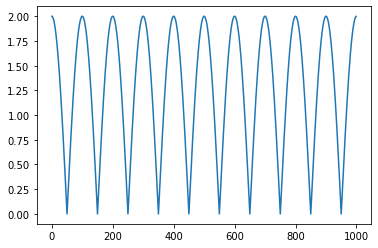

x and b


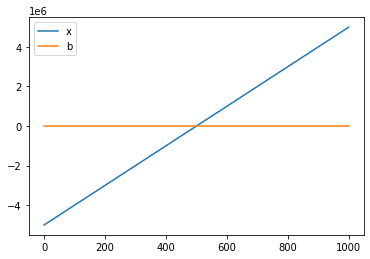

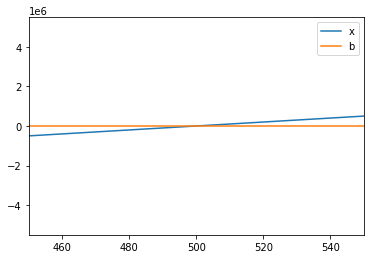

In [ ]:
          ### Doubles: Visibility Domain 2D ###
A = np.radians(1)/3600.
wavelenght = 2
r_F = np.sqrt((wavelenght*z)/(2*pi))


s = 20
image = np.zeros((s))
image[14] = 1
image[16] = 1
visibilityN = np.abs(np.fft.fftshift(np.fft.fft(image)))
b = np.linspace(-5e-5, 5e-5, 1000, endpoint=False)
print('b')
plt.plot(b)
plt.show()
double_image3 = np.where((np.abs(b - 0.5e-6)<1e-8) | (np.abs(b + 0.5e-6)<1e-8), np.ones(b.shape), np.zeros(b.shape))
#double_image3 = np.where((np.abs(b - 10/(r_F))<2.29e-05) | (np.abs(b + 0.001/r_F)<2.29e-05), np.ones(b.shape), np.zeros(b.shape))
#print(double_image3)
#print((np.abs(b - 0.5e-6)<1e-8) | (np.abs(b + 0.5e-6)<1e-8))
print('double image')
plt.plot(double_image3)
plt.show()

#print((10/(r_F) + 0.001/(r_F))/2)
#plt.figure(figsize=(12, 8), dpi=120)
vis_scale3 = np.fft.fftfreq(len(b), b[1]-b[0])

print('vis scale3')
plt.plot(vis_scale3)
plt.show()

vis3 = np.fft.fft(double_image3)
print('vis3')
plt.plot(np.fft.fftshift(np.abs(vis3)))
plt.show()
vis_max3 = (np.abs(vis3)).max()
#plt.plot(np.fft.fftshift(vis_scale3), np.fft.fftshift(np.abs(vis3))/vis_max3, 'o-')
#plt.xlabel("baseline length / $\lambda$")
#plt.axvline(0, linewidth=1, linestyle='-')

x = np.fft.fftshift(vis_scale3)

print('x and b')
plt.plot(x, label = 'x')
plt.plot(b, label='b')
plt.legend()
plt.show()
plt.plot(x, label = 'x')
plt.plot(b, label='b')
plt.legend()
plt.xlim((450,550))
plt.show()


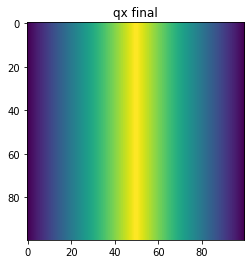

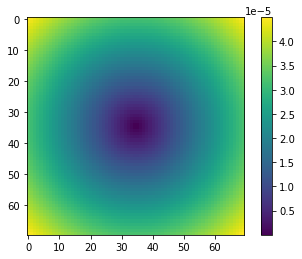

In [6]:


q, qx = get_q_doubles(2)
qx_fin = get_qx_final_double(qx)


plt.title('qx final')
plt.imshow(qx_fin)
plt.show()



#plt.figure(figsize=(12,12))
#plt.imshow(q)
#plt.colorbar()
#plt.show()

plt.imshow(q[15:85,15:85])
plt.colorbar()
plt.show()


Rotating

angle=0.0


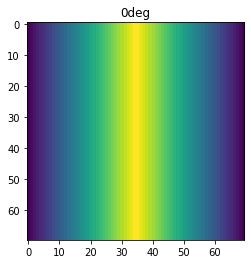

angle=30.0


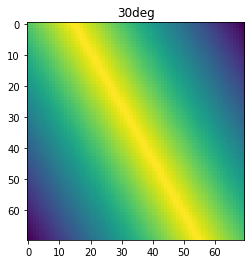

angle=60.0


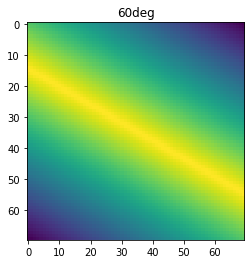

angle=90.0


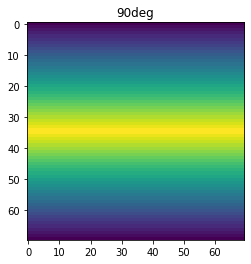

angle=120.0


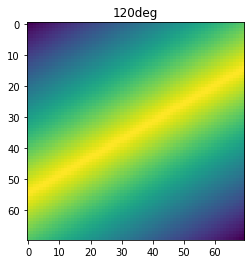

angle=150.0


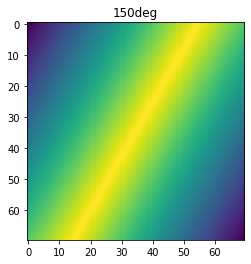

In [7]:
            ### Doubles, displacement along y-axis and rotation TEST   ###
qy = np.rot90(qx_fin, k=1, axes=(0, 1))
            ### Rotating q. For out case, q is qy, since it has the same values along x-axis  ###
## Tranculating the visibility by 2**0.5 after rotation to get rid of empty patches 

from scipy.ndimage import rotate
print('\nRotating\n')
for ang in np.arange(0, 180., 30):
    fig = plt.figure()
    print(f'angle={ang}')
    qx_final_rot = rotate(qx_fin, ang, reshape=False)
    qx_rot_trunc = qx_final_rot[15:85,15:85]
    plt.imshow(qx_rot_trunc)
    plt.title("%ddeg" % ang)
    plt.show()


Rotating



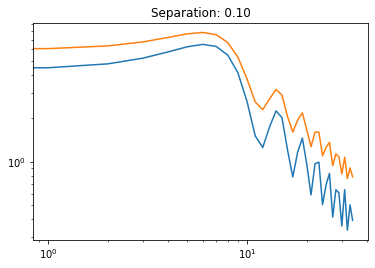

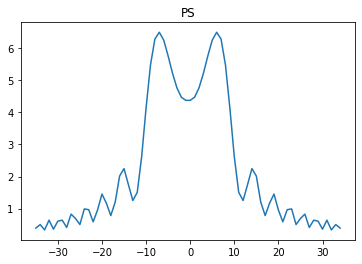

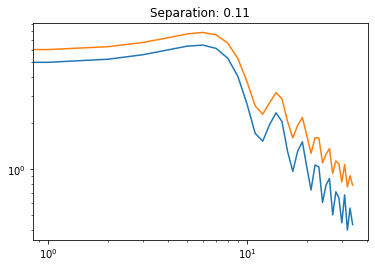

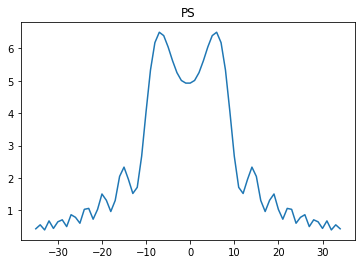

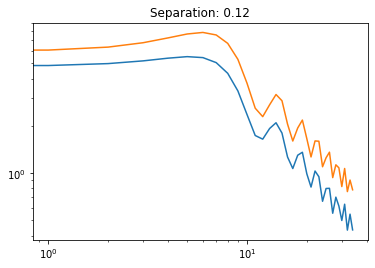

...

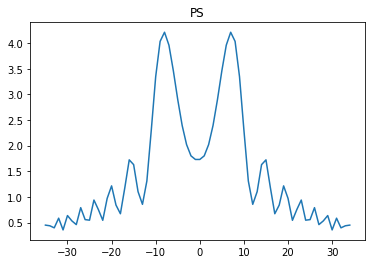

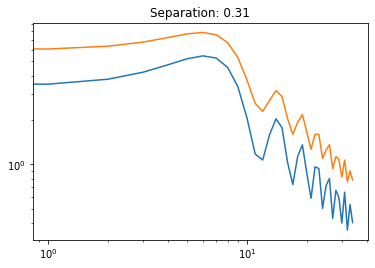

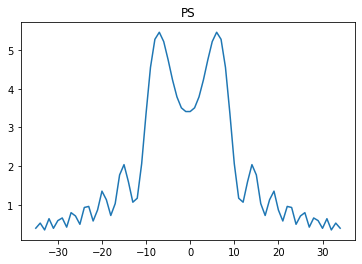

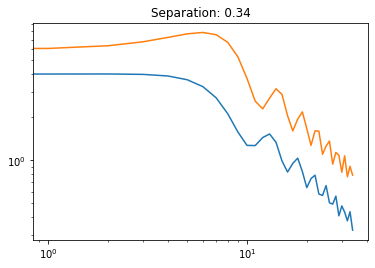

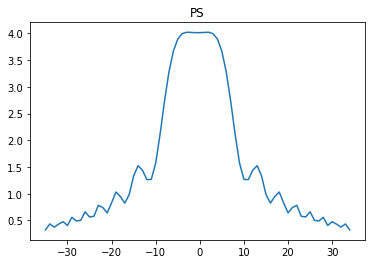

KeyboardInterrupt: ignored

In [12]:
            ###   Double's Scintillation Index +  rotation  ###

A = np.pi/(180*3600) # arcseconds to radians
wavelenght = 2
r_F = np.sqrt((wavelenght*z)/(2*pi))


from scipy.ndimage import rotate
print('\nRotating\n')
for ang in np.arange(0, 180., 30):
    fig = plt.figure()
    #print(f'fig={fig}')
    qx_rot = rotate(qx_fin, ang, reshape=False)
    #print(qy_rot.shape)
    qx_rot_trunc = qx_rot[15:85,15:85]
    
    #b = qy*z/k
    b = qx_rot_trunc * z/k
    q_reduced = (q[15:85,15:85])  # Resized q to suit rotated visibility 

    y_Dvalues = []
    x_Dvalues = []
    #array_x = np.arange(-50,50, 1)
    array_x = np.arange(-35,35, 1)
    


    separation_range = np.logspace(-1,1, 50) 
    for i in range(len(separation_range)):
      separation = separation_range[i]
      Visibility = np.abs(np.cos(np.pi*b*separation*A))
      #Visibility /= Visibility.max()   # Visibility
      FF = FresnelFilterNew(2, q_reduced)                       #### q_reduced for roated and q for 100x100 unrotated array 
      SI = ScintilationIndexNew(Visibility**2,FF)
      #print(f'double_line={double_line}')
      #plt.ylabel('cos function')
      #plt.xlabel('r_F range')
      #plt.plot(distance_metres, double_line)
      #plt.show()
      SInorm = ScintilationIndexNormalisation(FF,SI)

      powerSpectrum_source = np.sum(Visibility**2*FF, axis=1)
      plt.title(f'Separation: {separation:.2f}')
      plt.loglog(array_x, powerSpectrum_source)
      plt.loglog(array_x, np.sum(FF, axis=1))
      plt.show()
      plt.title('PS')
      plt.plot(array_x, powerSpectrum_source)
      plt.show()
      y_Dvalues.append(SInorm)
      x_Dvalues.append(separation)
    plt.imshow(qy_rot_trunc)
    plt.title("%ddeg" % ang)
    plt.show()

plt.plot(x_Dvalues, y_Dvalues)




In [ ]:
          ####  What you'll ultimately want is a function where you say get_double_ps(width=0.3, orientation=35) or get_gaussian(width=0.2, orientation=20  ####
          ####  and it will return the 1D power spectrum of a double with separation 0.3" and orientation 35deg.                                            ####



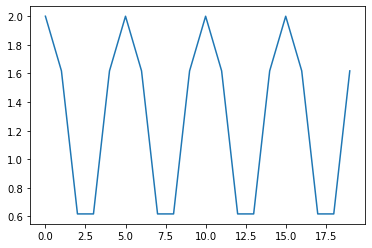

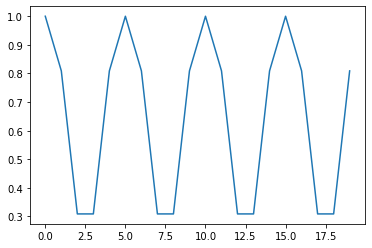

In [ ]:
### Messing around trying to make sence of simulation visibility plane straight awa... ###

s = 20
image = np.zeros((s))
image[2] = 1
image[18] = 1
visibilityN = np.abs(np.fft.fftshift(np.fft.fft(image)))
plt.plot(visibilityN)
plt.show()
Visibility = np.linspace(10/(r_F), 0.001/r_F, 50)

#vis_scale = np.fft.fftfreq(len(image), image[1]-image[0])
vis = np.fft.fft(image)
vis_max = (np.abs(vis)).max()
plot = np.fft.fftshift(np.abs(vis))/vis_max
plt.plot(plot)
#plt.plot(np.fft.fftshift(vis_scale), np.fft.fftshift(np.abs(vis))/vis_max, 'o-')
plt.show()

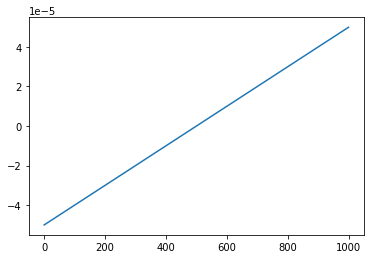

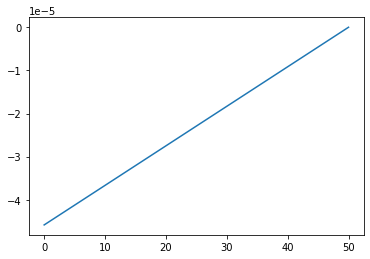

[4.58260295e-05 4.49096006e-05 4.39931716e-05 4.30767427e-05
 4.21603137e-05 4.12438848e-05 4.03274559e-05 3.94110269e-05
 3.84945980e-05 3.75781691e-05 3.66617401e-05 3.57453112e-05
 3.48288822e-05 3.39124533e-05 3.29960244e-05 3.20795954e-05
 3.11631665e-05 3.02467376e-05 2.93303086e-05 2.84138797e-05
 2.74974507e-05 2.65810218e-05 2.56645929e-05 2.47481639e-05
 2.38317350e-05 2.29153061e-05 2.19988771e-05 2.10824482e-05
 2.01660192e-05 1.92495903e-05 1.83331614e-05 1.74167324e-05
 1.65003035e-05 1.55838745e-05 1.46674456e-05 1.37510167e-05
 1.28345877e-05 1.19181588e-05 1.10017299e-05 1.00853009e-05
 9.16887198e-06 8.25244304e-06 7.33601411e-06 6.41958517e-06
 5.50315623e-06 4.58672729e-06 3.67029835e-06 2.75386942e-06
 1.83744048e-06 9.21011541e-07 4.58260295e-09]
median:  2.2915306050520633e-05
medIdx [25]


TypeError: ignored

In [ ]:
import statistics

rad_scale3 = np.linspace(-5e-5, 5e-5, 1000, endpoint=False)
b = np.linspace(10/(r_F), 0.001/r_F, 51)
plt.plot(rad_scale3)
plt.show()
plt.plot(-b)
plt.show()
med = np.median(b)
print(b)
print('median: ', med)
medIdx = np.where(b == med)
medIdx = medIdx[0]
print('medIdx', medIdx)
for i in range(len(b)):
  if b[i] == med:
    b = np.where((np.abs(b[i-1])) | (np.abs(b[i+1])), np.ones(b.shape), np.zeros(b.shape))
#double_image3 = np.where((np.abs(rad_scale3 - 0.5e-6)<1e-8) | (np.abs(rad_scale3 + 0.5e-6)<1e-8), np.ones(rad_scale3.shape), np.zeros(rad_scale3.shape))

plt.figure(figsize=(12, 8), dpi=120)
vis_scale3 = np.fft.fftfreq(len(rad_scale3), rad_scale3[1]-rad_scale3[0])
vis3 = np.fft.fft(double_image3)
vis_max3 = (np.abs(vis3)).max()
#plt.plot(np.fft.fftshift(vis_scale3), np.fft.fftshift(np.abs(vis3))/vis_max3, 'o-')
plt.xlabel("baseline length / $\lambda$")
plt.axvline(0, linewidth=1, linestyle='-')

x = np.fft.fftshift(vis_scale3)
plt.plot(x, np.abs(np.cos(np.pi*(x*1e-6))))
plt.xlim(-1e6, 1e6)

[0.1, 0.10730309405261562, 0.11513953993264472, 0.12354828882567469, 0.13257113655901093, 0.14225293134853698, 0.15264179671752334, 0.16378937069540642, 0.1757510624854792, 0.18858632787726495, 0.20235896477251572, 0.21713743029375185, 0.2329951810515372, 0.250011038261793, 0.2682695795279726, 0.2878615592354568, 0.3088843596477481, 0.33144247494664264, 0.35564803062231287, 0.3816213407949356, 0.40949150623804254, 0.43939705607607904, 0.47148663634573934, 0.5059197488435825, 0.5428675439323859, 0.5825136712468926, 0.6250551925273973, 0.6707035611184308, 0.7196856730011519, 0.7722449945836258, 0.8286427728546845, 0.889159333916464, 0.9540954763499939, 1.0237739663395848, 1.0985411419875584, 1.1787686347935873, 1.2648552168552958, 1.3572287829716538, 1.4563484775012436, 1.5627069765469948, 1.6768329368110082, 1.7992936232915524, 1.9306977288832496, 2.0716983998953076, 2.2229964825261943, 2.385344006431419, 2.5595479226995357, 2.746474114816052, 2.9470517025518097, 3.1622776601683795]
[0.

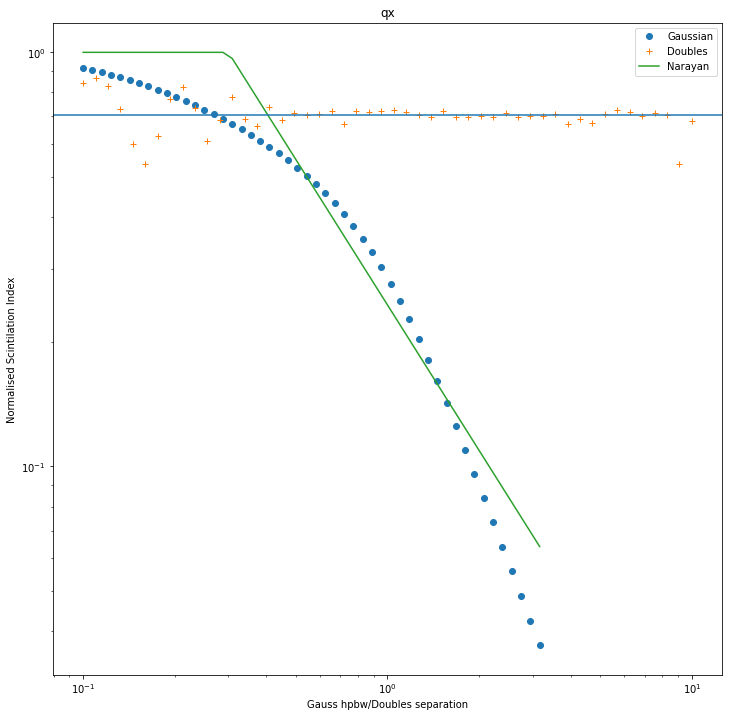

In [ ]:


get_nsi_plot(2)


In [ ]:
# Gaussian Power Spectrum 



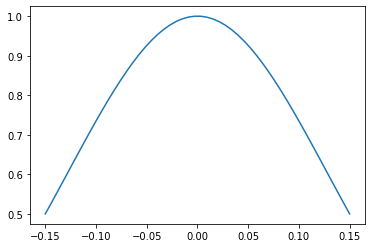

In [ ]:
from scipy.constants import au
from scipy.constants import au, c
import numpy as np

q = np.linspace(0.1*z/k, 10*z/k)
#np.sqrt(z/k)
a = np.degrees(1)/3600.

WAVELENGTH=2
A = np.radians(1)/3600.
F = 2*np.sqrt(2*np.log(2))
C = 2*A*F*np.pi
def get_gaussian_m(theta_s, x, wavelength=WAVELENGTH):
    """
    for a Gaussian of size theta_s in arcseconds, x, array of baseline lengths in m
    return visibility for that baseline lengths
    """
    

    #s = fft(x)
    #return np.exp(-(C/theta_s)** 2 * x/(2*np.pi/wavelength)) 

def get_gaussian_image(theta_s, s):
    """
    produce 1D gaussian for
    - Gaussian FWHM theta_s (in arcseconds)
    - 1d array of pixel coordinates s ( in arcseconds)
    """
    return np.exp(-0.5*(F*s/theta_s)**2)




def get_gaussian(theta_r, q, wavelength, z=au):
    q = np.linspace(0.1*z/k, 10*z/k)
    a = 2*np.pi/360./3600.
    f = 2*np.sqrt(2*np.log(2))
    C = 2*(a*f*np.pi)**2
    theta_s = a * theta_r
    #print(f"q={q}")
    #print(f"a={a}")
    #print(f"f={f}")
    #print(f"C={C}")
    fact = -C*z/(theta_r*a)**2
    #print(f"fact={fact}")
    y = np.exp(-C/theta_s**2 * q*z/(2*np.pi/wavelength))
    return y


standardDev_range = GaussSDevVariationsLog(-1,0.5,50)
for i in range(len(standardDev_range)):
  standardDev = standardDev_range[i]
  #theta_r = standardDev_range[i]
s = np.linspace(-0.15, 0.15)
Vis = get_gaussian_image(0.3, s)
#print(Vis)
plt.plot(s, Vis)
plt.show()

In [ ]:
def get_gaussian_image(theta_s, s):
    """
    produce 1D gaussian for
    - Gaussian FWHM theta_s (in arcseconds)
    - 1d array of pixel coordinates s ( in *radians*)
    """
    return np.exp(-0.5*(F*s/A/theta_s)**2)


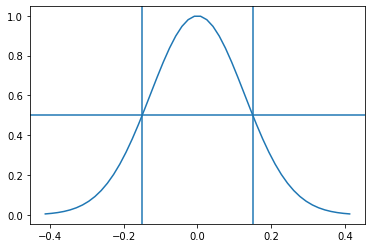

In [ ]:
sr = np.linspace(-2e-6, 2e-6, 50)
plt.plot(3600*np.degrees(sr), get_gaussian_image(0.3, sr))
plt.axhline(0.5)
plt.axvline(-0.15)
plt.axvline(0.15)

In [ ]:
def get_gaussian_visibilities(theta_s, b, w=2):
    """
    produce 1D gaussian for
    - Gaussian FWHM theta_s (in arcseconds)
    - 1d array of baseline lengths b ( in m)
    - wavelength in m
    """
    theta_r = A*theta_s
    b_hpbw = w/theta_r
    print(b_hpbw)
    return np.exp(-0.5*(F*b/b_hpbw)**2)


1375098.708313976


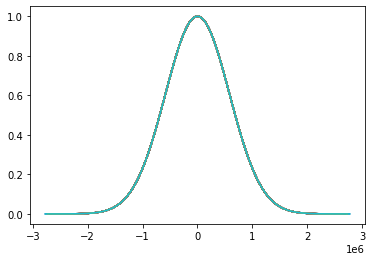

In [ ]:
WAVELENGTH=2
A = np.radians(1)/3600.
F = 2*np.sqrt(2*np.log(2))
C = 2*A*F*np.pi

b = np.linspace(-1e6, 1e6, 50)
b2 = np.sum(b1, axis=0)
q = b2*z/k
#print(q)
q1 = np.linspace(-q, q, 100)

#q = np.linspace(-300, 300, 50)
plt.plot(q1, get_gaussian_visibilities(0.3, q1, 2))
plt.show()
#plt.axhline(0.5)
#plt.axvline(-0.15)
#plt.axvline(0.15)


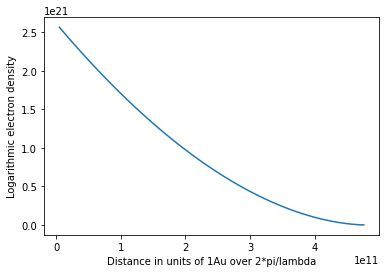

149597870700.0

In [ ]:
from scipy.constants import au, c
z=au
k = 2*np.pi / 2.
x = np.linspace(0.1*z/k, 10*z/k)
y = np.linspace(10*z/k, 0.1*z/k)
y = y**(11/6)
arr = np.array((y,x))
#my_yticks = np.arange(0,10**20, 10**5)
##my_xticks = np.arange(10**-5,10)
#plt.xticks(my_xticks)
#plt.yticks(my_yticks)
#plt.plot(x,y)
plt.xlabel('Distance in units of 1Au over 2*pi/lambda')
plt.ylabel('Logarithmic electron density')
plt.plot(x,y)
plt.show()
z


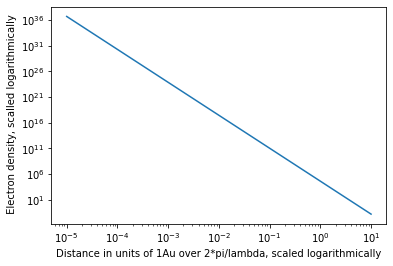

In [ ]:
x1=np.logspace(-5,1)
y1= np.logspace(20,-1)
y1 = y1**(11/6)
plt.xlabel('Distance in units of 1Au over 2*pi/lambda, scaled logarithmically')
plt.ylabel(' Electron density, scalled logarithmically')
plt.loglog(x1,y1)
plt.show()

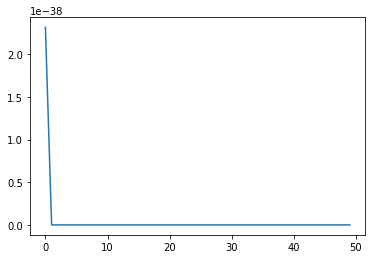

In [ ]:
x  = np.linspace(0.1*z/k, 10*z/k)
Vis = get_gaussian_m(0.3,x)
plt.plot(Vis)
plt.show()

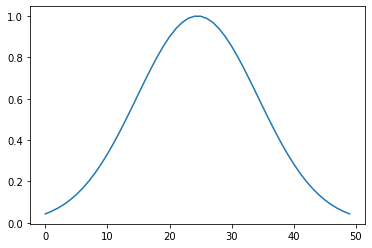

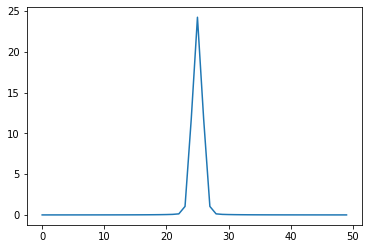

In [ ]:
x = np.linspace(-1,1)
Image = np.exp(-np.pi*x**2)
plt.plot(Image)
plt.show()

vis = abs(fft(Image))
#vis = fftshift(visibility)
#vis = np.exp(-np.pi*s**2)
vis = fftshift(vis)
plt.plot(vis)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:289: UserWarning: Legend does not support 'P' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:289: UserWarning: Legend does not support 'S' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:289: UserWarning: Legend does not support ' ' instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:289: UserWarning: Legend does not support 'o' instances.
A proxy artist may be used instead.
See: http://

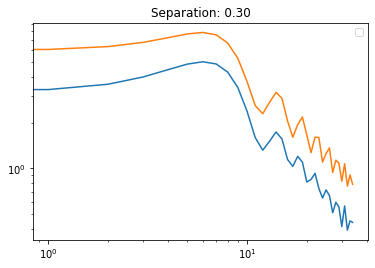

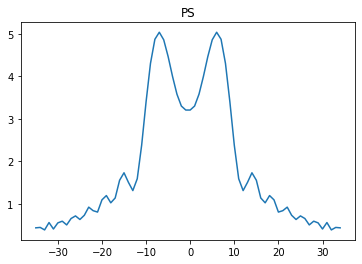

[0.4394662398439516, 0.449103770400181, 0.390519960932855, 0.5640789806219924, 0.4121397401007269, 0.5559211994233627, 0.595738023178891, 0.5082127157854477, 0.6587899184057677, 0.7196598208537969, 0.6358419869025252, 0.734557769802314, 0.925987797281216, 0.8429613161647371, 0.8101029142651144, 1.0976019705586206, 1.1980812009149453, 1.0278228846991706, 1.1418981926847962, 1.5586782468933087, 1.7338621848165743, 1.509015288491389, 1.3153234460245198, 1.5934684943075716, 2.383274961209949, 3.4014374794652884, 4.306003651004382, 4.8735335263039055, 5.0387540219073115, 4.861062166508537, 4.46710116601178, 3.9993253551019494, 3.5821299497808754, 3.303284396290247, 3.209395967484167, 3.209395967484165, 3.303284396290246, 3.5821299497808745, 3.9993253551019476, 4.467101166011778, 4.861062166508536, 5.038754021907316, 4.873533526303907, 4.3060036510043815, 3.4014374794652897, 2.383274961209949, 1.5934684943075714, 1.3153234460245198, 1.5090152884913888, 1.7338621848165743, 1.55867824689331, 1

In [19]:
      ###         Power SPectrum Fitting        ###

get_double_ps(0.3, 30)